In [1]:
import pandas as pd # Version 1.5.3
import seaborn as sns   # Version 0.13.2
import matplotlib.pyplot as plt # matplotlib Version 3.10.0
import starbars as sb   # Version 3.1.0
import numpy as np  # numpy Version 1.26.4
import scipy.stats as stats # scipy Version 1.14.0

from matplotlib.transforms import ScaledTranslation

Loading Longform iBA Data

In [2]:
DF = pd.read_csv("peripheral_ibas_longform.csv")

In [3]:
#Check if data types are as expected
DF.dtypes

Unnamed: 0                    int64
BA                           object
Conc                        float64
Fasted/Fed                   object
Serum/Plasma                 object
Analysis Technique           object
Healthy/Unhealthy            object
Exact Analysis Technique     object
Starting Volume             float64
Average Age                 float64
Number of Patients          float64
Protein Precipitation        object
NAFLD/NASH/Cirrhosis         object
Liver/Non-Liver              object
dtype: object

Loading Longform totalBA Data

In [4]:
total_DF = pd.read_csv("peripheral_total_longform.csv")

In [5]:
#Check if data types are as expected
total_DF.dtypes

Unnamed: 0                 int64
BA                        object
Conc                     float64
Fasted/Fed                object
Serum/Plasma              object
Analysis Technique        object
Healthy/Unhealthy         object
Liver/Non-liver           object
NAFLD/NASH/Cirrhosis      object
Protein Precipitation     object
Starting Volume          float64
dtype: object

Fig 2

In [6]:
#Filter both dataframes for only populations classified as normal
healthy_DF = DF[DF["Healthy/Unhealthy"].isin(["Normal"])]
healthy_total_DF = total_DF[total_DF["Healthy/Unhealthy"].isin(["Normal"])]

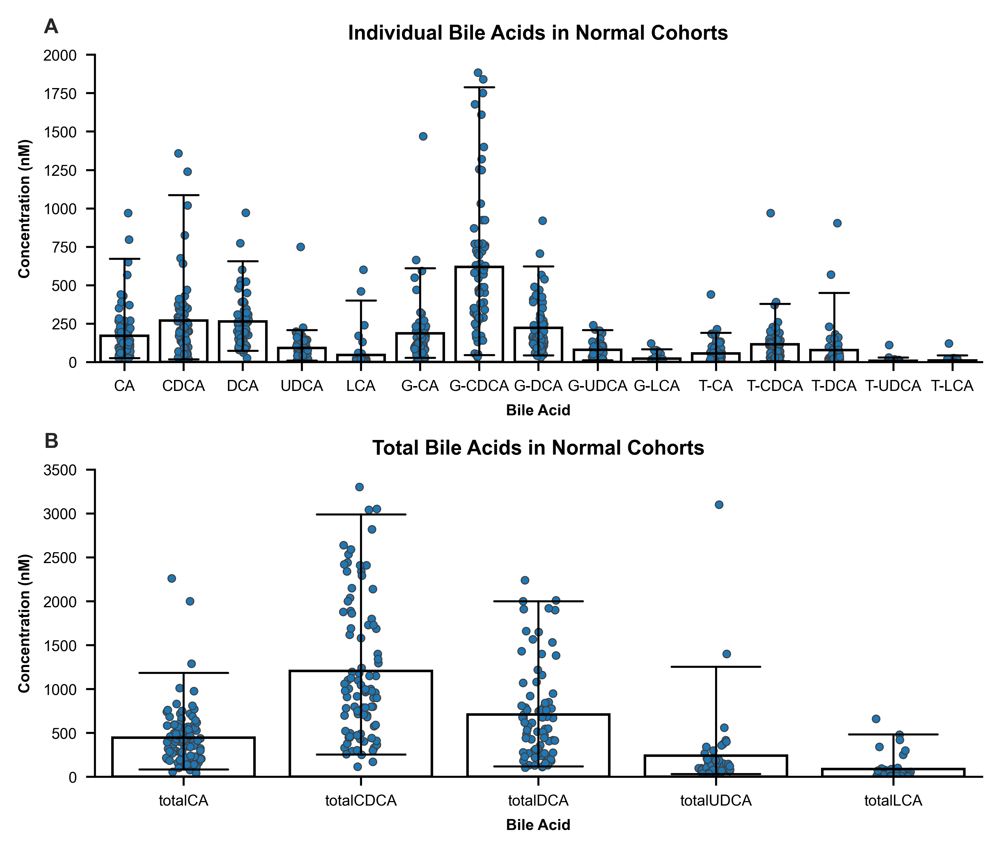

In [7]:
fig, axs = plt.subplot_mosaic([['A', 'A', 'A'], ['B', 'B','B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

#Fig A
sns.barplot(x="BA", y="Conc", data=healthy_DF, ax=ax1, errorbar="pi", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, color = 'black', zorder=10, )
sns.stripplot(x='BA', y='Conc', data=healthy_DF, dodge=False, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, zorder=1)

ax1.set_ylim(0, 2000)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Normal Cohorts", fontsize=8, weight='bold')


#Fig B
sns.barplot(x="BA", y="Conc", data=healthy_total_DF, ax=ax2, errorbar="pi", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, color = 'black', zorder=10)
sns.stripplot(x='BA', y='Conc', data=healthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, zorder=1)

ax2.set_ylim(0, 3500)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Normal Cohorts", fontsize=8, weight='bold')

for ax in [ax1, ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=6)
    ax.yaxis.set_tick_params(labelsize=6)

#fig.suptitle("Peripheral Blood: Normal Populations", fontsize=8, weight='bold')

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.35)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')


#plt.savefig("Joseph_fig2.eps", bbox_inches='tight')

plt.show()


Fig 3

In [8]:
peripheral_data = pd.read_csv("peripheral_data_nm.csv")

In [9]:
no_duplicates = peripheral_data.drop_duplicates(subset=["Paper"])

In [10]:
technique_count = no_duplicates['Analysis Technique'].value_counts()
technique_count.sort_values()

Capillary Electrophoresis     1
HPLC                          2
GLC                           3
GC-MS                        10
LC-MS                        49
Name: Analysis Technique, dtype: int64

In [11]:
lcms_gcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"].isin(["LC-MS", "GC-MS"])]
lcms_gcms_healthy_total_DF = healthy_total_DF[healthy_total_DF["Analysis Technique"].isin(["LC-MS", "GC-MS"])]

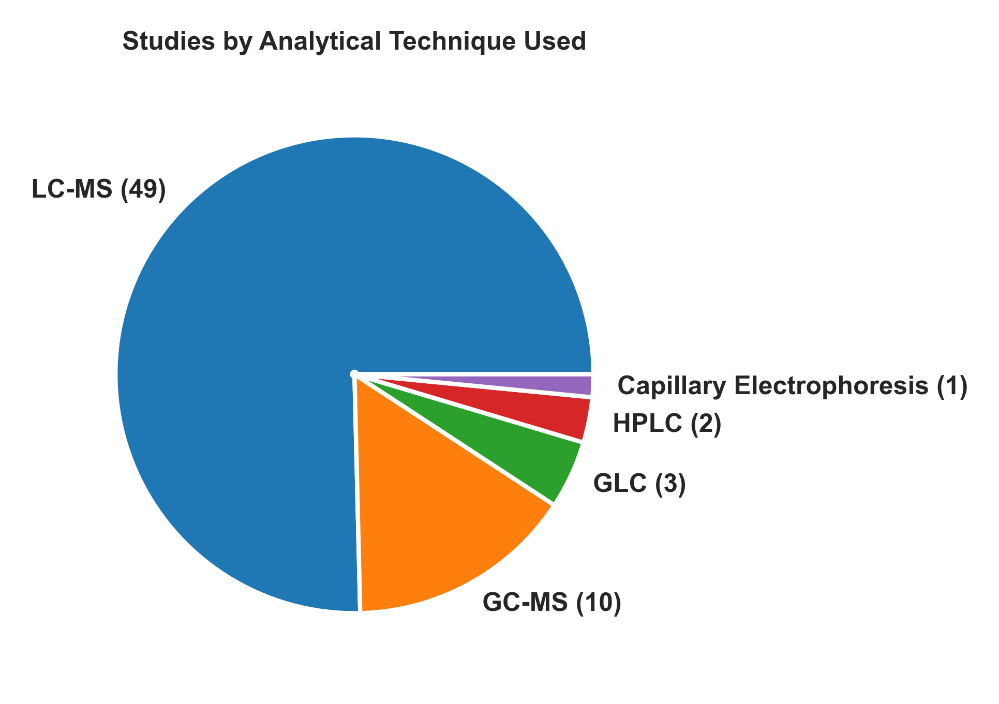

In [12]:
fig, axs = plt.subplot_mosaic([['A']], figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']

#Fig A - Pie Chart of Studies by Analytical Technique Used
ax1.pie(technique_count, labels=[f"{value} ({count})" for value, count in technique_count.items()],  textprops={'fontsize': 6, 'fontweight': 'bold'}, wedgeprops=dict(width=0.99))

ax1.set_title("Studies by Analytical Technique Used",fontsize=6, weight='bold', loc='center')

for label, ax in axs.items():
    if ax != ax1:
        ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
        # ax.text(
        # 0.0, 1.0, label, transform=(
        #     ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        # fontsize='10', va='bottom', weight='bold')
    # else:
    #     ax.text(
    #     -0.3, 1.0, label, transform=(
    #         ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
    #     fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=6)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

#plt.savefig("Joseph_fig3.eps", bbox_inches='tight')

plt.show()


S2 Fig

In [13]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        lcms_values = ba_filtered[ba_filtered["Analysis Technique"] == "LC-MS"]["Conc"].dropna().to_list()
        gcms_values = ba_filtered[ba_filtered["Analysis Technique"] == "GC-MS"]["Conc"].dropna().to_list()

        if len(lcms_values) < 5 or len(gcms_values) < 5:
            p_value = np.nan
        else:
            # Perform Welch's t-test
            t_statistic, p_value = stats.ttest_ind(lcms_values, gcms_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        if not pd.isnull(p_value):
            annotations.append((("LC-MS", ba), ("GC-MS", ba), p_value))

    return annotations

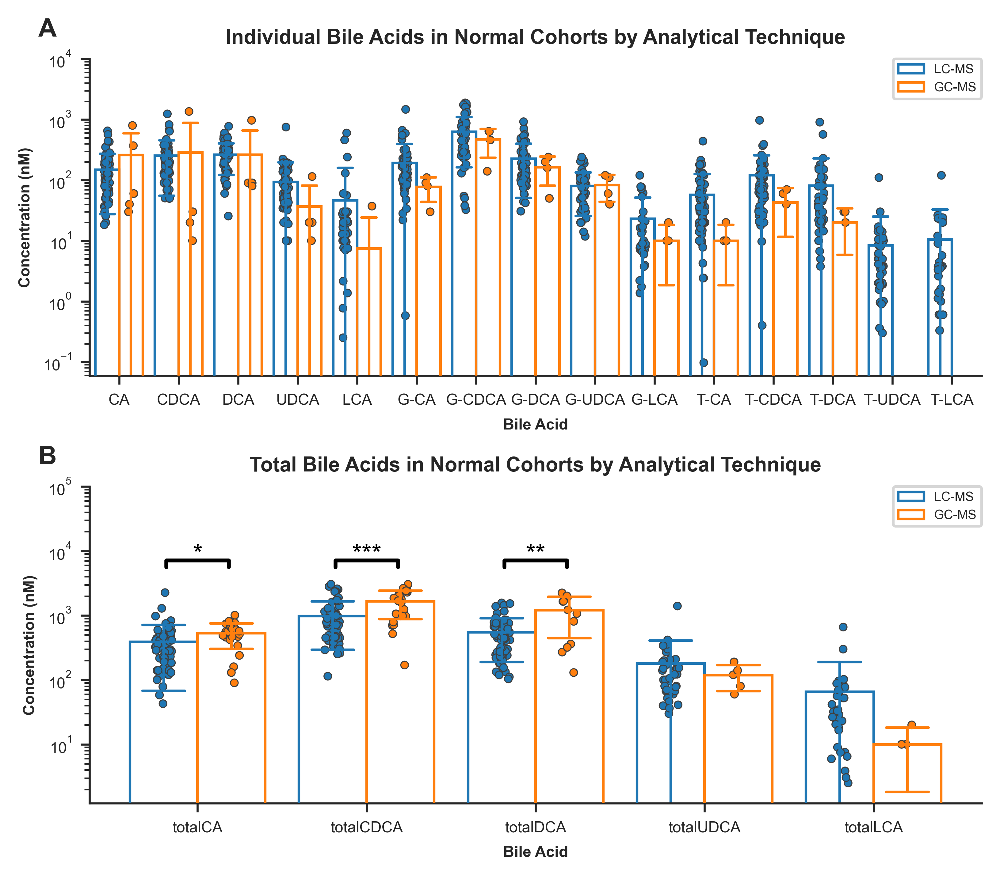

In [17]:
fig, axs = plt.subplot_mosaic([['A'],['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']


#Fig A - iBAs - LC-MS vs GC-MS
sns.barplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_DF, ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, hue_order=["LC-MS", "GC-MS"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_DF, ax=ax1, dodge=True, alpha=1, linewidth=0.4, size = 3, hue_order=["LC-MS", "GC-MS"], legend=False, zorder=1)


ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Normal Cohorts by Analytical Technique", fontsize=8, weight='bold')
ax1.set_yscale('log')
ax1.set_ylim(None, 1e4)

#Fig B - totalBAs - LC-MS vs GC-MS
sns.barplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_total_DF, ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, hue_order=["LC-MS", "GC-MS"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_total_DF, ax=ax2, dodge=True, alpha=1, linewidth=0.4, size = 3, hue_order=["LC-MS", "GC-MS"], legend=False, zorder=1)


ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Normal Cohorts by Analytical Technique", fontsize=8, weight='bold')
ax2.set_yscale('log')
#ax3.set_ylim(0, 3500)


for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=6)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


ax2_annotations = automatic_annotations(lcms_gcms_healthy_total_DF, "total")
#starbars.draw_annotation(ax3_annotations, ax=ax3, bar_margin=0.001, top_margin=0.0001, tip_length=0.3, ns_show=False)
sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False, top_margin=0.0001)
ax2.set_ylim(None, 1e5)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.35)

#plt.savefig("S2-Fig.eps", bbox_inches='tight')

plt.show()

Fig 4

In [18]:
lcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"].isin(["LC-MS"])]
lcms_healthy_total_DF = healthy_total_DF[healthy_total_DF["Analysis Technique"].isin(["LC-MS"])]

In [19]:
lcms_fasted_fed_healthy_DF = lcms_healthy_DF[lcms_healthy_DF["Fasted/Fed"].isin(["Fasted", "Fed"])]
lcms_fasted_fed_healthy_total_DF = lcms_healthy_total_DF[lcms_healthy_total_DF["Fasted/Fed"].isin(["Fasted", "Fed"])]

In [31]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        fasted_values = ba_filtered[ba_filtered["Fasted/Fed"] == "Fasted"]["Conc"].dropna().to_list()
        fed_values = ba_filtered[ba_filtered["Fasted/Fed"] == "Fed"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(fasted_values, fed_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        if not pd.isnull(p_value):
            annotations.append((("Fasted", ba), ("Fed", ba), p_value))

    return annotations

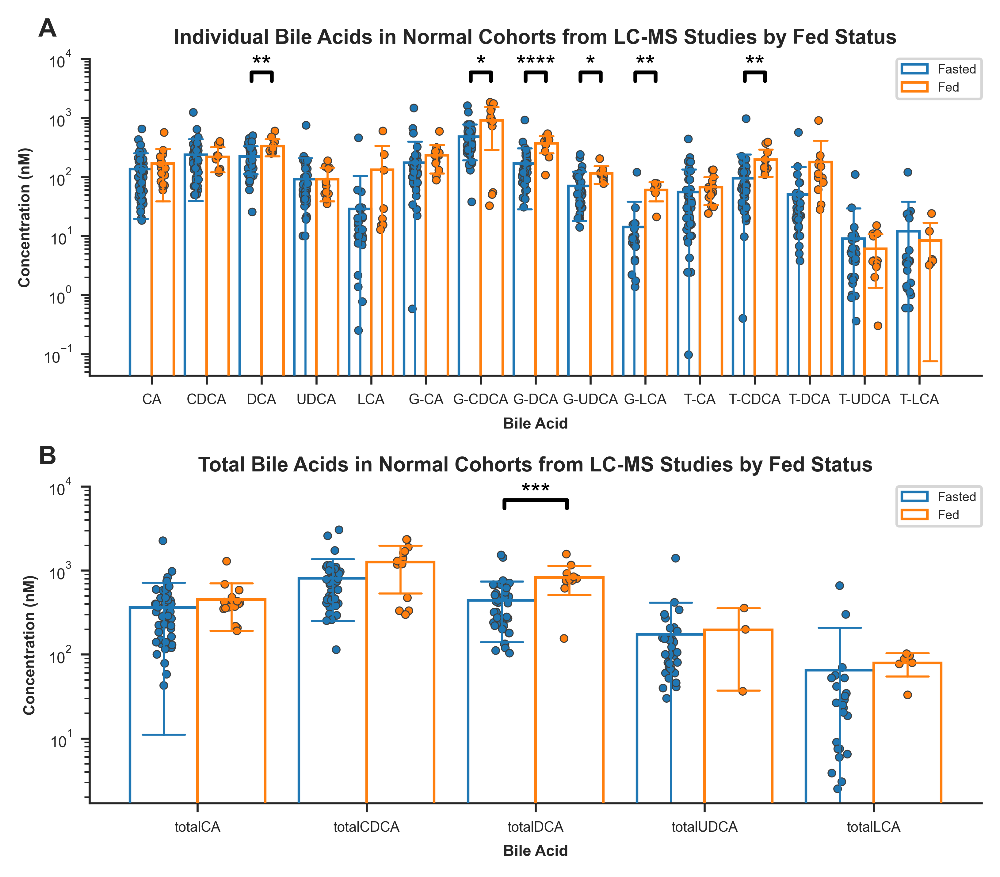

In [32]:
fig, axs = plt.subplot_mosaic([['A'],['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A - LC-MS iBAs by Fasted/Fed
sns.barplot(x="BA", y="Conc", data=lcms_fasted_fed_healthy_DF, ax=ax1, hue="Fasted/Fed", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Fasted", "Fed"], zorder=10)
#sns.pointplot(x='BA', y='Conc', data=lcms_fasted_fed_healthy_DF, ax=ax1, hue="Fasted/Fed", errorbar='sd', linestyle="none", capsize=0.3, err_kws= {'linewidth': 0.8}, dodge=0.4, marker="_", markersize=12, markeredgewidth=2, zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_fasted_fed_healthy_DF, dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, hue="Fasted/Fed", hue_order=["Fasted", "Fed"], zorder=1)


ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Normal Cohorts from LC-MS Studies by Fed Status", fontsize=8, weight='bold')
ax1.set_yscale('log')



#Fig B - LC-MS totalBAs by Fasted/Fed
sns.barplot(x="BA", y="Conc", data=lcms_fasted_fed_healthy_total_DF, ax=ax2, hue="Fasted/Fed", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Fasted", "Fed"], zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_fasted_fed_healthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, hue="Fasted/Fed", hue_order=["Fasted", "Fed"], zorder=1)


ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Normal Cohorts from LC-MS Studies by Fed Status", fontsize=8, weight='bold')
ax2.set_yscale('log')


for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)



ax1_annotations = automatic_annotations(lcms_fasted_fed_healthy_DF, "individual")
sb.draw_annotation(ax1_annotations, ax=ax1, ns_show=False, top_margin=0.0001 )
ax1.set_ylim(None, 1e4)


ax2_annotations = automatic_annotations(lcms_fasted_fed_healthy_total_DF, "total")
sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False, top_margin=0.0001)
ax2.set_ylim(None, 1e4)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.35)

#plt.savefig("Joseph_fig4.eps", bbox_inches='tight')

plt.show()


Fig 5

In [24]:
lcms_fasted_healthy_DF = lcms_fasted_fed_healthy_DF[lcms_fasted_fed_healthy_DF["Fasted/Fed"].isin(["Fasted"])]
lcms_fasted_healthy_total_DF = lcms_fasted_fed_healthy_total_DF[lcms_fasted_fed_healthy_total_DF["Fasted/Fed"].isin(["Fasted"])]

In [25]:
lcms_serum_plasma_fasted_healthy_DF = lcms_fasted_healthy_DF[lcms_fasted_healthy_DF["Serum/Plasma"].isin(["Serum", "Plasma"])]
lcms_serum_plasma_fasted_healthy_total_DF = lcms_fasted_healthy_total_DF[lcms_fasted_healthy_total_DF["Serum/Plasma"].isin(["Serum", "Plasma"])]

In [26]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        serum_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Conc"].dropna().to_list()
        plasma_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(serum_values, plasma_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Serum", ba), ("Plasma", ba), p_value))

    return annotations

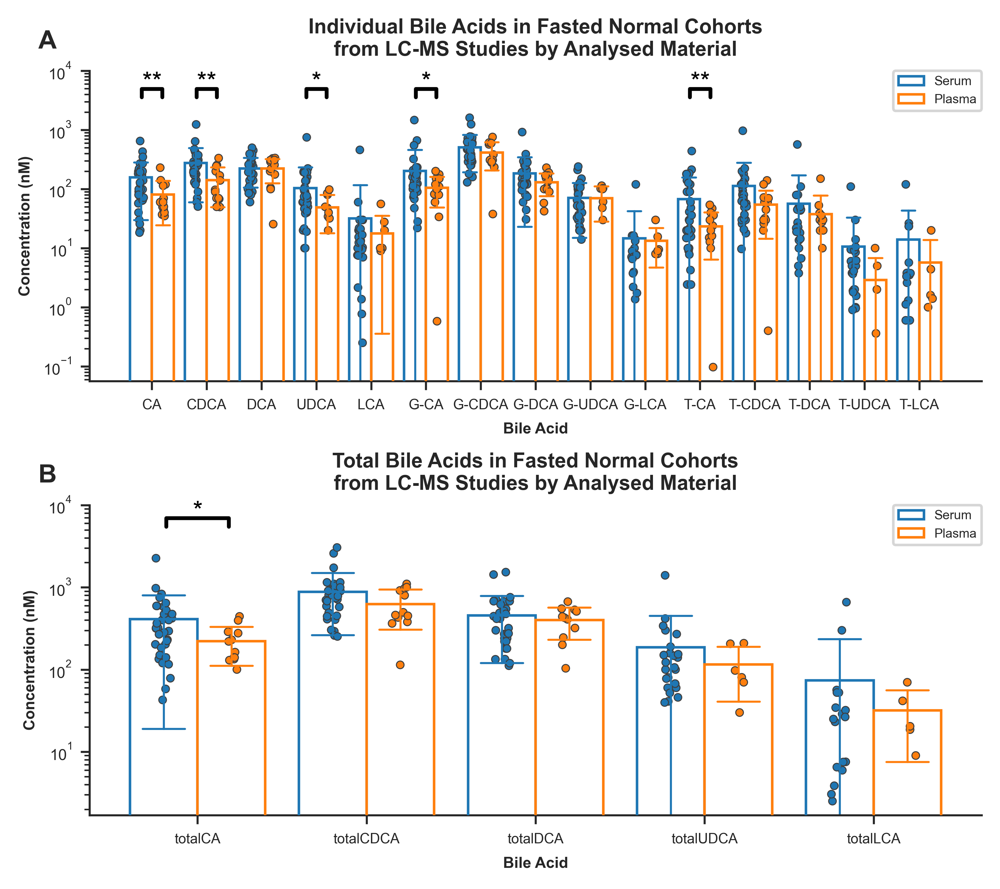

In [30]:
fig, axs = plt.subplot_mosaic([['A'],['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A - LC-MS Fasted iBAs by Serum/Plasma
sns.barplot(x="BA", y="Conc", data=lcms_serum_plasma_fasted_healthy_DF, ax=ax1, hue="Serum/Plasma", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Serum", "Plasma"], zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_serum_plasma_fasted_healthy_DF, dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, hue="Serum/Plasma", hue_order=["Serum", "Plasma"], zorder=1)

ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Fasted Normal Cohorts\nfrom LC-MS Studies by Analysed Material", fontsize=8, weight='bold')
ax1.set_yscale('log')

#Fig B - LC-MS Fasted totalBAs by Serum/Plasma
sns.barplot(x="BA", y="Conc", data=lcms_serum_plasma_fasted_healthy_total_DF, ax=ax2, hue="Serum/Plasma", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Serum", "Plasma"], zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_serum_plasma_fasted_healthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, hue="Serum/Plasma", hue_order=["Serum", "Plasma"], zorder=1)

ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Fasted Normal Cohorts\nfrom LC-MS Studies by Analysed Material", fontsize=8, weight='bold')
ax2.set_yscale('log')

for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
ax1.xaxis.set_tick_params(labelsize=5.5)

ax1_annotations = automatic_annotations(lcms_serum_plasma_fasted_healthy_DF, "individual")
sb.draw_annotation(ax1_annotations, ax=ax1, ns_show=False, top_margin=0.0001)
ax1.set_ylim(None, 1e4)

ax2_annotations = automatic_annotations(lcms_serum_plasma_fasted_healthy_total_DF, "total")
sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False, top_margin=0.0001)
ax2.set_ylim(None, 1e4)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.4)

#plt.savefig("Joseph_fig5.eps", bbox_inches='tight')

plt.show()

S3 Table

In [33]:
#Statistical test for altered variance in iBAs- Brown-Forsythe

bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

p_values = {}
for ba in bas_list:
    ba_filtered = lcms_serum_plasma_fasted_healthy_DF[lcms_serum_plasma_fasted_healthy_DF["BA"] == ba]
    serum_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Conc"].dropna().to_list()
    plasma_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Conc"].dropna().to_list()
    
    stat, p_value = stats.levene(serum_values, plasma_values, center='median')

    p_values.update({ba: [p_value, np.var(serum_values), np.var(plasma_values)]})


In [34]:
p_values

{'CA': [0.07668786591157364, 15652.295718967769, 2950.6946792899403],
 'CDCA': [0.26489735588470176, 46090.335991135056, 7822.22296331361],
 'DCA': [0.43203997015734474, 12986.798485361445, 8955.395756213018],
 'UDCA': [0.2981525848907993, 16115.068205295007, 849.208644],
 'LCA': [0.646346673802658, 6935.34563623903, 267.35984375],
 'G-CA': [0.31310079113650974, 64943.11169652964, 2913.497240310643],
 'G-CDCA': [0.4694993367683189, 97948.41273118301, 40124.84],
 'G-DCA': [0.2748439514987026, 25020.969360992418, 2651.9691786982244],
 'G-UDCA': [0.7863716179769509, 3020.4939886517764, 1501.4158984375],
 'G-LCA': [0.6492374440714288, 715.8790370993376, 62.2125],
 'T-CA': [0.09057493598316584, 7820.005939197405, 268.2257318008223],
 'T-CDCA': [0.354256349261569, 27444.30808985431, 1456.068070100591],
 'T-DCA': [0.5501807304057722, 12589.729738828004, 1444.6915702479341],
 'T-UDCA': [0.5452287665816999, 487.2119511034432, 13.149546755555557],
 'T-LCA': [0.5574915875260136, 824.0804470305069

In [35]:
#Statistical test for altered variance in totalBAs- Brown-Forsythe

bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]

p_values = {}
for ba in bas_list:
    ba_filtered = lcms_serum_plasma_fasted_healthy_total_DF[lcms_serum_plasma_fasted_healthy_total_DF["BA"] == ba]
    serum_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Conc"].dropna().to_list()
    plasma_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Conc"].dropna().to_list()
    
    #stat, p_value = stats.levene(serum_values, plasma_values)
    stat, p_value = stats.levene(serum_values, plasma_values, center='median')

    p_values.update({ba: [p_value, np.var(serum_values), np.var(plasma_values)]})

In [36]:
p_values

{'totalCA': [0.1508842641265256, 149840.17917910204, 11210.72388888889],
 'totalCDCA': [0.40555727734129954, 366615.32713985426, 92448.31222222222],
 'totalDCA': [0.17729087924458264, 108504.55146865235, 25982.837190082646],
 'totalUDCA': [0.5551286342165156, 67970.13671775149, 4645.776989533334],
 'totalLCA': [0.5083668550297848, 24523.38863333334, 475.8495999999999]}

Fig 6

In [37]:
plasma_fasted_lcms_nm_data = peripheral_data.loc[ (peripheral_data["Healthy/Unhealthy"] == "Normal") & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Plasma")] 


In [38]:
plasma_fasted_lcms_nm_data.loc[:, "Total BAs"] = plasma_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3939459864.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plasma_fasted_lcms_nm_data.loc[:, "Total BAs"] = plasma_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)


In [39]:
volume_counts = plasma_fasted_lcms_nm_data['Starting Volume'].value_counts()
volume_counts = volume_counts.sort_index()

In [40]:
gcdca_plasma_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="G-CDCA")]
tudca_plasma_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="T-UDCA")]

In [41]:
tudca_plasma_fasted_lcms_normal_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Exact Analysis Technique,Starting Volume,Average Age,Number of Patients,Protein Precipitation,NAFLD/NASH/Cirrhosis,Liver/Non-Liver
2835,2835,T-UDCA,NaN,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,50.0,40.5,26.0,Methanol,Normal,Healthy
2851,2851,T-UDCA,2.0000,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,20.0,NaN,NaN,Methanol,Normal,Healthy
2864,2864,T-UDCA,NaN,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,100.0,30.1,71.0,Acetonitrile,Normal,Healthy
2875,2875,T-UDCA,0.3608,Fasted,Plasma,LC-MS,Normal,UPLC-ESI-MS,50.0,NaN,21.0,Sodium Hydroxide,Normal,Healthy
2885,2885,T-UDCA,NaN,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,250.0,NaN,NaN,Acetonitrile,Normal,Healthy
2899,2899,T-UDCA,NaN,Fasted,Plasma,LC-MS,Normal,HPLC-MS,100.0,53.0,35.0,Acetonitrile,Normal,Healthy
2900,2900,T-UDCA,NaN,Fasted,Plasma,LC-MS,Normal,HPLC-MS,100.0,46.0,200.0,Acetonitrile,Normal,Healthy
2906,2906,T-UDCA,NaN,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,29.0,7.0,Methanol,NaN,Non-Liver
2927,2927,T-UDCA,10.0000,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,38.5,85.0,Methanol,Normal,Healthy
2928,2928,T-UDCA,5.0000,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,47.1,59.0,Methanol,Normal,Healthy


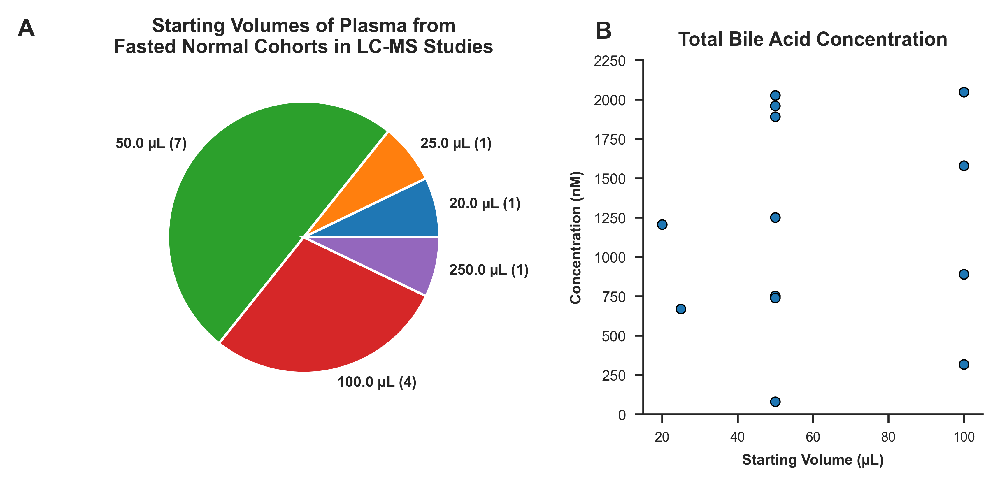

In [42]:
fig, axs = plt.subplot_mosaic([['A', 'B']],figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A
ax1.pie(volume_counts, labels=[f"{value} µL ({count})" for value, count in volume_counts.items()],  textprops={'fontsize': 6, 'fontweight': 'bold'})

ax1.set_title("Starting Volumes of Plasma from\nFasted Normal Cohorts in LC-MS Studies", fontsize=8, weight='bold')

#Fig B
sns.scatterplot(data=plasma_fasted_lcms_nm_data, x="Starting Volume", y="Total BAs", ax=ax2, s=15, edgecolor='black', linewidth=0.5)

ax2.set_ylim(0, 2250)
ax2.set_xlim(15,105)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Starting Volume (µL)", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acid Concentration", fontsize=8, weight='bold')


for label, ax in axs.items():

    if ax == ax1:
        ax.text(
            -0.2, 1.03, label, transform=(
                ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
            fontsize='10', va='bottom', weight='bold')
    else: 
        ax.text(
            0.0, 1, label, transform=(
                ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
            fontsize='10', va='bottom', weight='bold')
        ax.xaxis.set_tick_params(labelsize=5.5)
        ax.yaxis.set_tick_params(labelsize=6)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.35)

#plt.savefig("Joseph_fig6.eps", bbox_inches='tight')


plt.show()

Fig 7

In [43]:
plasma_fifty_fasted_lcms_nm_data = plasma_fasted_lcms_nm_data.loc[plasma_fasted_lcms_nm_data["Starting Volume"] == 50]

In [44]:
protein_precipitation_counts = plasma_fifty_fasted_lcms_nm_data['Protein Precipitation'].value_counts()
protein_precipitation_counts = protein_precipitation_counts.sort_index(ascending=False)

In [45]:
gcdca_plasma_fifty_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="G-CDCA") & (healthy_DF["Starting Volume"] == 50)]
tudca_plasma__fifty_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="T-UDCA") & (healthy_DF["Starting Volume"] == 50)]

In [46]:
gcdca_plasma_fifty_fasted_lcms_normal_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Exact Analysis Technique,Starting Volume,Average Age,Number of Patients,Protein Precipitation,NAFLD/NASH/Cirrhosis,Liver/Non-Liver
1330,1330,G-CDCA,235.0,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,50.0,40.5,26.0,Methanol,Normal,Healthy
1370,1370,G-CDCA,NaN,Fasted,Plasma,LC-MS,Normal,UPLC-ESI-MS,50.0,NaN,21.0,Sodium Hydroxide,Normal,Healthy
1401,1401,G-CDCA,602.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,29.0,7.0,Methanol,NaN,Non-Liver
1422,1422,G-CDCA,611.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,38.5,85.0,Methanol,Normal,Healthy
1423,1423,G-CDCA,598.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,47.1,59.0,Methanol,Normal,Healthy
1426,1426,G-CDCA,280.0,Fasted,Plasma,LC-MS,Normal,UPLC-MS/MS,50.0,59.7,15.0,Acetonitrile,Normal,Healthy
1427,1427,G-CDCA,310.0,Fasted,Plasma,LC-MS,Normal,UPLC-MS/MS,50.0,59.4,15.0,Acetonitrile,NaN,NaN


In [47]:
plasma_fasted_lcms_total_DF = total_DF.loc[ (total_DF["Healthy/Unhealthy"] == "Normal") & (total_DF["Analysis Technique"] == "LC-MS") & (total_DF["Fasted/Fed"] == "Fasted") & (total_DF["Serum/Plasma"] == "Plasma")] 

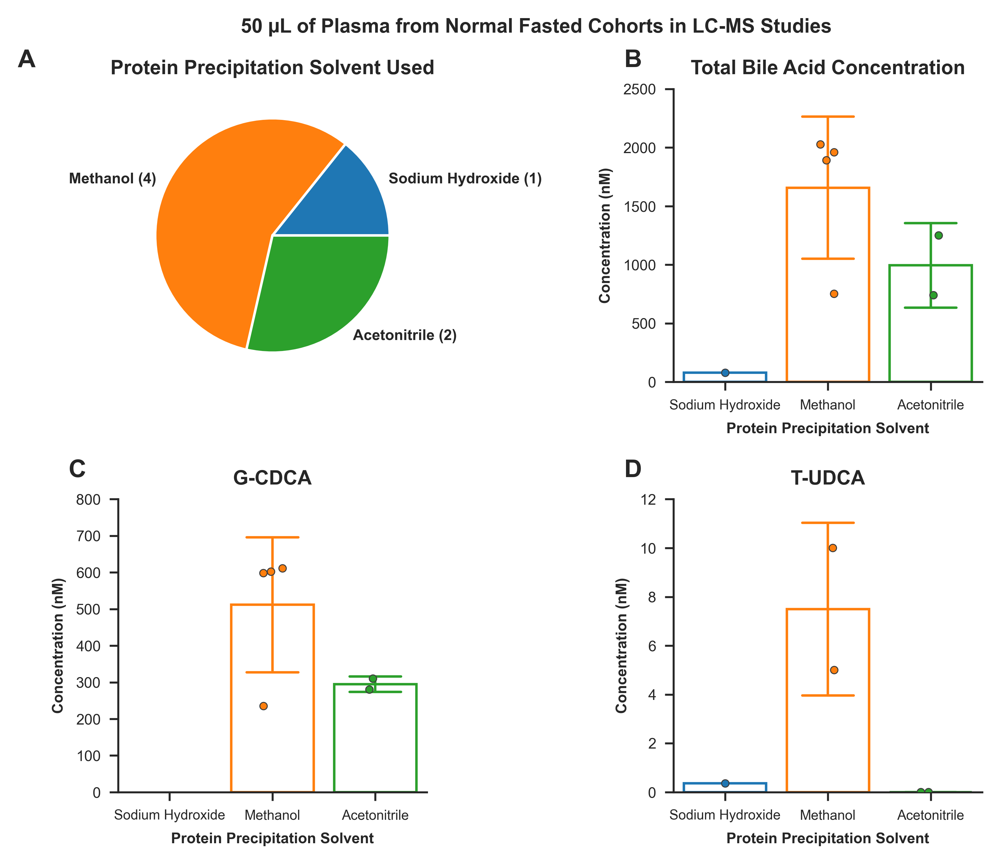

In [48]:
fig, axs = plt.subplot_mosaic([['A', 'B'], ['C', 'D']],figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']
ax4 = axs['D']



#Fig A
ax1.pie(protein_precipitation_counts, labels=[f"{value} ({count})" for value, count in protein_precipitation_counts.items()],  textprops={'fontsize': 6, 'fontweight': 'bold'})


ax1.set_title("Protein Precipitation Solvent Used", fontsize=8, weight='bold')

#Fig B
sns.barplot(data=plasma_fifty_fasted_lcms_nm_data, x="Protein Precipitation", y="Total BAs", ax=ax2, hue="Protein Precipitation", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"], hue_order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"] )
sns.stripplot(data=plasma_fifty_fasted_lcms_nm_data, x='Protein Precipitation', y='Total BAs', hue='Protein Precipitation', ax=ax2, dodge=False, alpha=1, linewidth=0.4, size = 3, hue_order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"], legend=False)

ax2.set_ylim(0, 2500)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acid Concentration", fontsize=8, weight='bold')


#Fig C
sns.barplot(data=gcdca_plasma_fifty_fasted_lcms_normal_DF, x="Protein Precipitation", y="Conc", ax=ax3, hue="Protein Precipitation", errorbar='sd', capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"], hue_order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"])
sns.stripplot(data=gcdca_plasma_fifty_fasted_lcms_normal_DF, x='Protein Precipitation', y="Conc", ax=ax3, hue='Protein Precipitation',  dodge=False, alpha=1, linewidth=0.4, size = 3, hue_order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"], legend=False)

ax3.set_ylim(0, 800)
ax3.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax3.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax3.set_title("G-CDCA", fontsize=8, weight='bold')


#Fig D
sns.barplot(data=tudca_plasma__fifty_fasted_lcms_normal_DF, x="Protein Precipitation", y="Conc", ax=ax4, hue="Protein Precipitation", errorbar='sd', capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"], hue_order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"])
sns.stripplot(data=tudca_plasma__fifty_fasted_lcms_normal_DF, x='Protein Precipitation', y="Conc", ax=ax4, hue='Protein Precipitation',  dodge=False, alpha=1, linewidth=0.4, size = 3, hue_order= ["Sodium Hydroxide", "Methanol", "Acetonitrile"], legend=False)

ax4.set_ylim(0, 12)
ax4.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax4.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax4.set_title("T-UDCA", fontsize=8, weight='bold')


for label, ax in axs.items():

    if ax == ax1:
        ax.text(
            -0.2, 1.0, label, transform=(
                ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
            fontsize='10', va='bottom', weight='bold')
    else: 
        ax.text(
            0.0, 1, label, transform=(
                ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
            fontsize='10', va='bottom', weight='bold')
        ax.xaxis.set_tick_params(labelsize=5.5)
        ax.yaxis.set_tick_params(labelsize=6)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.8, top=0.9, hspace=0.4)


fig.suptitle("50 µL of Plasma from Normal Fasted Cohorts in LC-MS Studies",fontsize=8, weight='bold')

#plt.savefig("Joseph_fig7.eps", bbox_inches='tight')

plt.show()

Fig 8

In [49]:
healthy_unhealthy_DF = DF.loc[DF['Healthy/Unhealthy'].isin(["Normal", "Unhealthy"])]
healthy_unhealthy_total_DF = total_DF.loc[total_DF['Healthy/Unhealthy'].isin(["Normal", "Unhealthy"])]

In [50]:
peripheral_data["Total BAs"] = peripheral_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

In [51]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Conc"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

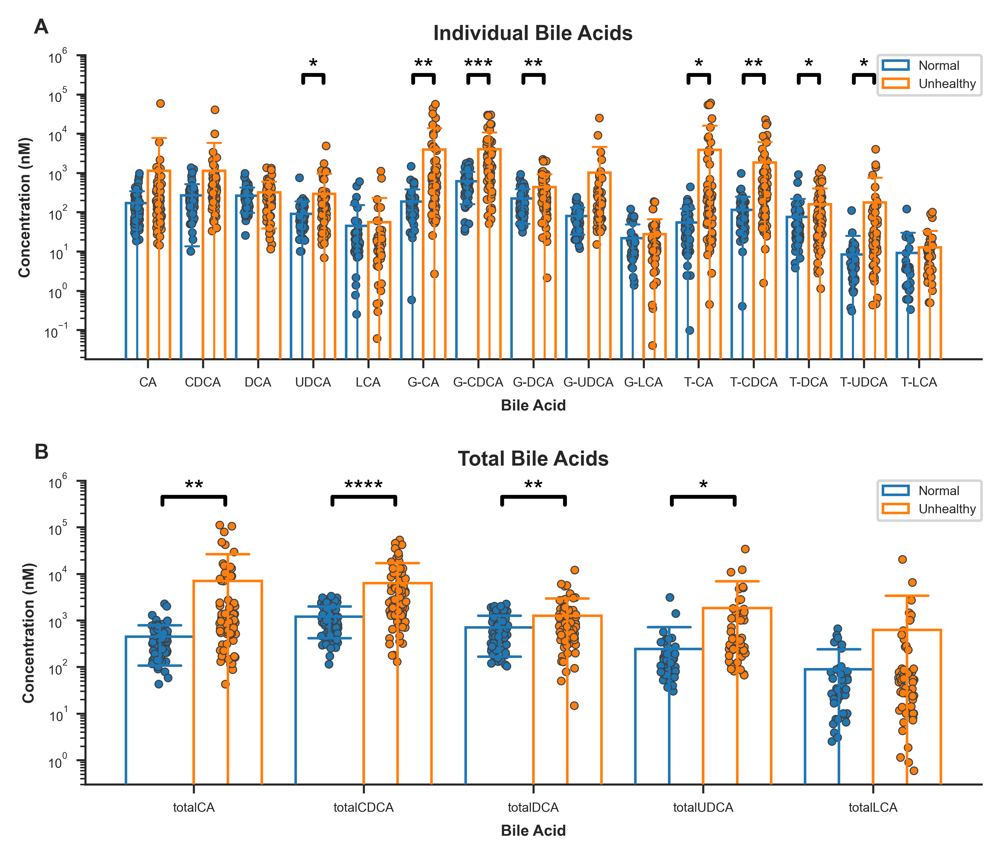

In [54]:
fig, axs = plt.subplot_mosaic([['A', 'A', 'A'], ['B', 'B','B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

#Fig A

sns.barplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_DF, ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, hue_order=["Normal", "Unhealthy"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_DF, dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, hue_order=["Normal", "Unhealthy"], legend=False, zorder=1)


ax1.set_ylabel('Concentration (nM)', fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids", fontsize=8, weight='bold')
ax1.set_yscale('log')



#Fig B

sns.barplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_total_DF, ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, hue_order=["Normal", "Unhealthy"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, hue_order=["Normal", "Unhealthy"], legend=False, zorder=1)

ax2.set_ylabel('Concentration (nM)', fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids", fontsize=8, weight='bold')
ax2.set_yscale('log')

for ax in [ax1,ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=5)
    ax.yaxis.set_tick_params(labelsize=5)
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)


plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

#Annotations
#Ax1
ax1_annotations = automatic_annotations(healthy_unhealthy_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None, 1e6)

#Ax2
ax2_annotations = automatic_annotations(healthy_unhealthy_total_DF, type="total")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(None, 1e6)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')

#plt.savefig("Joseph_fig8.eps", bbox_inches='tight')

plt.show()

Fig 9 (use starbars 2.0.1)

In [55]:
metabolic_hcc_peripheral_data = peripheral_data.loc[peripheral_data["Metabolic/HCC/Cholestatsis"].isin(["Normal", "Metabolic", "HCC", "Cholestasis"])]

In [56]:
nafld_cirrhosis_peripheral_data = peripheral_data.loc[peripheral_data["NAFLD/NASH/Cirrhosis"].isin(["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"])]

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3592611207.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3592611207.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3592611207.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3592611207.py:53: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax4.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364

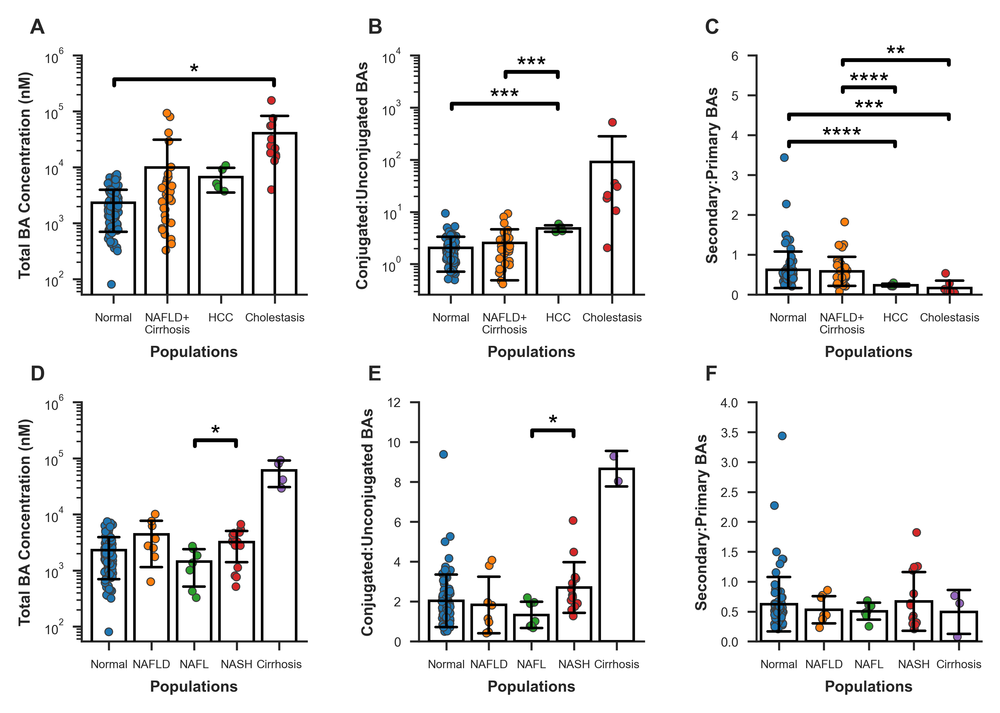

In [57]:
fig, axs = plt.subplot_mosaic([['A', 'B', 'C'], ['D', 'E','F']], figsize=(6.26, 4), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']
ax4 = axs['D']
ax5 = axs['E']
ax6 = axs['F']

#Fig A
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="Total BAs", ax=ax1, data=metabolic_hcc_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="Total BAs", ax=ax1, data=metabolic_hcc_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=1)

ax1.set_ylabel("Total BA Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Populations", fontsize=6, weight='bold')
ax1.set_yscale('log')
ax_xticklabels = ["Normal", "NAFLD+\nCirrhosis", "HCC", "Cholestasis"] 
ax1.set_xticklabels(ax_xticklabels)

#Fig B
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="Conjugated:Unconjugated", ax=ax2, data=metabolic_hcc_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="Conjugated:Unconjugated", ax=ax2, data=metabolic_hcc_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=1)



ax2.set_ylabel("Conjugated:Unconjugated BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Populations", fontsize=6, weight='bold')
ax2.set_yscale('log')

ax2.set_xticklabels(ax_xticklabels)

#Fig C
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="2nd:1st", ax=ax3, data=metabolic_hcc_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="2nd:1st", ax=ax3, data=metabolic_hcc_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=1)


ax3.set_ylabel("Secondary:Primary BAs", fontsize=6, weight='bold')
ax3.set_xlabel("Populations", fontsize=6, weight='bold')

ax3.set_xticklabels(ax_xticklabels)


#Fig D
sns.barplot(x="NAFLD/NASH/Cirrhosis", y="Total BAs", ax=ax4, data=nafld_cirrhosis_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=10)
sns.stripplot(x="NAFLD/NASH/Cirrhosis", y="Total BAs", ax=ax4, data=nafld_cirrhosis_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="NAFLD/NASH/Cirrhosis", hue_order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=1)


ax4.set_ylabel("Total BA Concentration (nM)", fontsize=6, weight='bold')
ax4.set_xlabel("Populations", fontsize=6, weight='bold')
ax4.set_yscale('log')

ax_xticklabels = ["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"] 
ax4.set_xticklabels(ax_xticklabels)

#Fig E
sns.barplot(x="NAFLD/NASH/Cirrhosis", y="Conjugated:Unconjugated", ax=ax5, data=nafld_cirrhosis_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=10)
sns.stripplot(x="NAFLD/NASH/Cirrhosis", y="Conjugated:Unconjugated", ax=ax5, data=nafld_cirrhosis_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="NAFLD/NASH/Cirrhosis", hue_order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=1)



ax5.set_ylabel("Conjugated:Unconjugated BAs", fontsize=6, weight='bold')
ax5.set_xlabel("Populations", fontsize=6, weight='bold')

ax5.set_ylim(0, 10)
ax5.set_xticklabels(ax_xticklabels)

#Fig F
sns.barplot(x="NAFLD/NASH/Cirrhosis", y="2nd:1st", ax=ax6, data=nafld_cirrhosis_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=10)
sns.stripplot(x="NAFLD/NASH/Cirrhosis", y="2nd:1st", ax=ax6, data=nafld_cirrhosis_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="NAFLD/NASH/Cirrhosis", hue_order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=1)


ax6.set_ylabel("Secondary:Primary BAs", fontsize=6, weight='bold')
ax6.set_xlabel("Populations", fontsize=6, weight='bold')
ax6.set_ylim(0, 3.5)
ax6.set_xticklabels(ax_xticklabels)

ax1_annotations = [(('Normal'), ('Cholestasis'), 0.0399)]
sb.draw_annotation(ax1_annotations, ax=ax1)
ax1.set_ylim(None, 1e6)

ax2_annotations = [(('NAFLD+\nCirrhosis'), ('HCC'), 0.0003), (('Normal'), ('HCC'), 0.0007)]
sb.draw_annotation(ax2_annotations, ax=ax2)
ax2.set_ylim(None, 1e4)

ax3_annotations = [ (('NAFLD+\nCirrhosis'), ('HCC'), 0.00009), (('Normal'), ('HCC'), 0.00001),(('NAFLD+\nCirrhosis'), ('Cholestasis'), 0.0022), (('Normal'), ('Cholestasis'), 0.0006)]
sb.draw_annotation(ax3_annotations, ax=ax3)
ax3.set_ylim(0, 6)

ax4_annotations = [(('NAFL'), ('NASH'), 0.0473)]
sb.draw_annotation(ax4_annotations, ax=ax4)
ax4.set_ylim(0, 1e6)

ax5_annotations = [(('NAFL'), ('NASH'), 0.0192)]
sb.draw_annotation(ax5_annotations, ax=ax5)
ax5.set_ylim(0, 12)


ax6.set_ylim(0, 4)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=4.5)
    ax.yaxis.set_tick_params(labelsize=5)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.45)


#plt.savefig("Joseph_fig9.eps", bbox_inches='tight')

plt.show()

Fig 10

In [58]:
methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data = peripheral_data.loc[ (peripheral_data["Metabolic/HCC/Cholestatsis"].isin(["Normal", "Metabolic", "HCC", "Cholestasis"])) & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Plasma") & (peripheral_data["Starting Volume"] == 50) & (peripheral_data["Protein Precipitation"] == "Methanol")] 
methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data.loc[:, "Total BAs"] = methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\2386586489.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data.loc[:, "Total BAs"] = methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)


In [59]:
methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data

,Unnamed: 0,Paper,Ref,Serum/Plasma,#Subjects,Healthy/Unhealthy,Fasted/Fed,Analysis Technique,Units,CA,...,Reconstitution Solvent,Extraction Method,Derivitisation,Exact Analysis Technique,Publication Year,Value Type,Total Bilirubin (mg/dL),NOTES,Number of Patients,Total BAs
40,40,Bile Acid Alterations Are Associated With Insu...,https://doi.org/10.1210/jc.2017-01397,Plasma,26,Normal,Fasted,LC-MS,nM,37.0,...,Methanol:H2O,NaN,NaN,LC-MS/MS,2017,Median,0.49,LC-MS/MS: Median; No-NASH; normal liver; or mi...,26.0,752.0
41,41,Bile Acid Alterations Are Associated With Insu...,https://doi.org/10.1210/jc.2017-01397,Plasma,32,Unhealthy,Fasted,LC-MS,nM,27.0,...,Methanol:H2O,NaN,NaN,LC-MS/MS,2017,Median,0.56,LC-MS/MS: Median; NASH,32.0,805.0
130,130,NASH-related increases in plasma bile acid lev...,https://doi.org/10.1016/j.jhepr.2020.100222,Plasma,17,Unhealthy,Fasted,LC-MS,nM,205.0,...,Methanol:H2O,NaN,NaN,HPLC-MS/MS,2020,Arithmetic Mean,NaN,HPLC-MS/MS: Mean; No-T2D; NASH,17.0,4269.7
131,131,NASH-related increases in plasma bile acid lev...,https://doi.org/10.1016/j.jhepr.2020.100222,Plasma,58,Unhealthy,Fasted,LC-MS,nM,266.0,...,Methanol:H2O,NaN,NaN,HPLC-MS/MS,2020,Arithmetic Mean,NaN,HPLC-MS/MS: Mean; T2D; NASH,58.0,4638.2
132,132,NASH-related increases in plasma bile acid lev...,https://doi.org/10.1016/j.jhepr.2020.100222,Plasma,85,Normal,Fasted,LC-MS,nM,141.0,...,Methanol:H2O,NaN,NaN,HPLC-MS/MS,2020,Arithmetic Mean,NaN,HPLC-MS/MS: Mean; No-T2D; No NASH,85.0,2026.6
133,133,NASH-related increases in plasma bile acid lev...,https://doi.org/10.1016/j.jhepr.2020.100222,Plasma,59,Normal,Fasted,LC-MS,nM,114.0,...,Methanol:H2O,NaN,NaN,HPLC-MS/MS,2020,Arithmetic Mean,NaN,HPLC-MS/MS: Mean; T2D; No NASH,59.0,1959.4


In [60]:
def automatic_annotations_features(DF, type): 
    
    p_values = []
    if type == "total":
        normal_values = DF[DF["Metabolic/HCC/Cholestatsis"]=="Normal"]["Total BAs"].dropna().to_list()
        metabolic_values = DF[DF["Metabolic/HCC/Cholestatsis"]=="Metabolic"]["Total BAs"].dropna().to_list()
    elif type == "conjunconj":
        normal_values = DF[DF["Metabolic/HCC/Cholestatsis"]=="Normal"]["Conjugated:Unconjugated"].dropna().to_list()
        metabolic_values = DF[DF["Metabolic/HCC/Cholestatsis"]=="Metabolic"]["Conjugated:Unconjugated"].dropna().to_list()
    elif type == "2:1":
        normal_values = DF[DF["Metabolic/HCC/Cholestatsis"]=="Normal"]["2nd:1st"].dropna().to_list()
        metabolic_values = DF[DF["Metabolic/HCC/Cholestatsis"]=="Metabolic"]["2nd:1st"].dropna().to_list()

    t_statistic, p_value = stats.ttest_ind(normal_values, metabolic_values, equal_var=False)

    p_values.append(p_value)

    annotations = [(("Normal"), ("Metabolic"), p_value)]
    
    return annotations

In [64]:
ax1_annotations = automatic_annotations_features(methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, "total")
ax1_annotations

[('Normal', 'Metabolic', 0.3062960800528363)]

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\2745034987.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\2745034987.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\2745034987.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(ax_xticklabels)


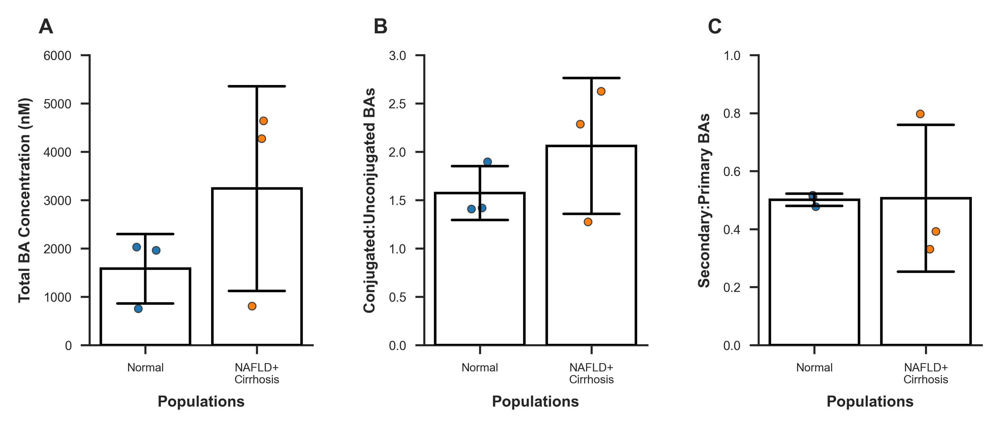

In [65]:
fig, axs = plt.subplot_mosaic([['A', 'B', 'C']], figsize=(6.26, 2), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']

#Fig A
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="Total BAs", ax=ax1, data=methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="Total BAs", ax=ax1, data=methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic"], zorder=1, legend=False)


ax1.set_ylabel("Total BA Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Populations", fontsize=6, weight='bold')
ax_xticklabels = ["Normal", "NAFLD+\nCirrhosis"] 
ax1.set_xticklabels(ax_xticklabels)

#Fig B
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="Conjugated:Unconjugated", ax=ax2, data=methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="Conjugated:Unconjugated", ax=ax2, data=methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic"], zorder=1, legend=False)


ax2.set_ylabel("Conjugated:Unconjugated BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Populations", fontsize=6, weight='bold')
ax2.set_xticklabels(ax_xticklabels)    

#Fig C
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="2nd:1st", ax=ax3, data=methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="2nd:1st", ax=ax3, data=methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic"], zorder=1, legend=False)


ax3.set_ylabel("Secondary:Primary BAs", fontsize=6, weight='bold')
ax3.set_xlabel("Populations", fontsize=6, weight='bold')
ax3.set_xticklabels(ax_xticklabels)


for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=4.5)
    ax.yaxis.set_tick_params(labelsize=5)

# ax1_annotations = automatic_annotations_features(methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, "total")
# sb.draw_annotation(ax1_annotations, ax=ax1, ns_show=False)
ax1.set_ylim(0, 6000)

# ax2_annotations = automatic_annotations_features(methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, "conjunconj")
# sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False)
ax2.set_ylim(0, 3)

# ax3_annotations = automatic_annotations_features(methanol_fifty_plasma_fasted_lcms_healthy_unhealthy_peripheral_data, "2:1")
# sb.draw_annotation(ax3_annotations, ax=ax3, ns_show=False)
ax3.set_ylim(0, 1)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.45)

#plt.savefig("Joseph_fig10.eps", bbox_inches='tight')


plt.show()




Fig 11

In [212]:
#DF = pd.read_csv("peripheral_data_nm.csv")

In [66]:
healthy_unhealthy_DF = peripheral_data.loc[(peripheral_data["Healthy/Unhealthy"].isin(["Normal", "Unhealthy"]))]

In [67]:
new_DF = pd.DataFrame(data=healthy_unhealthy_DF[["Healthy/Unhealthy", "CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA", "Metabolic/HCC/Cholestatsis"]])

In [68]:
new_DF

,Healthy/Unhealthy,CA,CDCA,DCA,UDCA,LCA,G-CA,G-CDCA,G-DCA,G-UDCA,G-LCA,T-CA,T-CDCA,T-DCA,T-UDCA,T-LCA,Metabolic/HCC/Cholestatsis
0,Unhealthy,237.0,359.0,441.0,NaN,20.9,417.0,1917.0,1038.0,387.0,53.8,236.0,384.0,268.0,25.40,16.9,Metabolic
1,Normal,142.0,135.9,261.0,NaN,15.0,234.0,54.5,402.0,109.0,61.2,67.1,141.0,904.0,3.80,3.5,Normal
2,Normal,184.0,119.0,262.0,NaN,19.6,228.0,923.0,389.0,101.0,53.5,67.3,140.0,96.7,3.80,4.0,Normal
3,Unhealthy,166.0,325.0,447.0,NaN,20.0,432.0,129.0,926.0,335.0,43.4,239.0,372.0,283.0,18.10,15.1,Metabolic
4,Normal,107.0,131.0,263.0,NaN,15.4,233.0,50.4,441.0,115.0,77.2,68.4,150.0,97.3,3.70,3.8,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210,Normal,50.3,50.1,25.5,NaN,NaN,33.8,37.8,42.2,NaN,NaN,16.1,26.1,35.9,NaN,NaN,Normal
211,Normal,193.7,191.9,395.0,77.3,7.5,322.7,580.3,283.1,106.1,NaN,126.9,223.6,79.3,6.18,NaN,Normal
212,Normal,60.0,140.0,310.0,NaN,20.0,60.0,290.0,90.0,100.0,30.0,20.0,30.0,NaN,NaN,20.0,Normal
213,Normal,390.0,410.0,320.0,160.0,170.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal


In [69]:
nonan_DF = new_DF.dropna(subset=["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"])
nonan_DF

,Healthy/Unhealthy,CA,CDCA,DCA,UDCA,LCA,G-CA,G-CDCA,G-DCA,G-UDCA,G-LCA,T-CA,T-CDCA,T-DCA,T-UDCA,T-LCA,Metabolic/HCC/Cholestatsis
16,Unhealthy,119.000000,120.000000,282.000000,113.000000,8.000000,44040.000000,30140.000000,689.000000,2170.000000,39.000000,60610.000000,22850.000000,410.000000,435.000000,20.000000,NaN
17,Unhealthy,334.000000,652.000000,215.000000,108.000000,18.000000,1260.000000,3974.000000,506.000000,546.000000,26.000000,467.000000,831.000000,129.000000,51.000000,14.000000,HCC
18,Unhealthy,398.000000,931.000000,418.000000,230.000000,21.000000,694.000000,2786.000000,540.000000,315.000000,27.000000,269.000000,522.000000,110.000000,24.000000,10.000000,NaN
19,Unhealthy,492.000000,1064.000000,398.000000,252.000000,15.000000,551.000000,2810.000000,769.000000,798.000000,28.000000,153.000000,407.000000,167.000000,63.000000,10.000000,NaN
20,Normal,268.000000,676.000000,530.000000,169.000000,25.000000,196.000000,1678.000000,469.000000,188.000000,23.000000,33.000000,182.000000,82.000000,17.000000,9.000000,Normal
21,Unhealthy,69.500000,104.700000,32.200000,88.400000,17.700000,1965.200000,4901.200000,178.200000,793.900000,15.000000,690.000000,1996.500000,90.000000,128.100000,17.600000,NaN
22,Unhealthy,82.100000,157.800000,73.600000,225.400000,17.800000,1438.400000,3349.400000,178.600000,1087.700000,22.900000,491.500000,1157.300000,63.500000,151.600000,14.000000,NaN
23,Unhealthy,85.100000,253.900000,129.000000,236.900000,24.200000,817.100000,2835.600000,232.000000,899.800000,23.300000,228.900000,830.800000,76.700000,107.600000,14.500000,NaN
24,Unhealthy,130.300000,552.500000,78.800000,1153.200000,22.000000,934.400000,3762.900000,144.900000,3336.700000,14.200000,195.200000,764.900000,39.000000,241.900000,10.900000,NaN
25,Unhealthy,186.700000,551.100000,198.400000,326.300000,34.600000,651.800000,2632.700000,253.000000,727.600000,27.600000,114.700000,399.500000,62.700000,55.300000,9.500000,Metabolic


In [70]:
def catergorize_value(value):
    if value in ["Normal", "Metabolic"]:
        return value
    else:
        return "Other"

In [71]:
nonan_DF["Metabolic/HCC/Cholestatsis"] = nonan_DF["Metabolic/HCC/Cholestatsis"].apply(catergorize_value)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3019460212.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF["Metabolic/HCC/Cholestatsis"] = nonan_DF["Metabolic/HCC/Cholestatsis"].apply(catergorize_value)


In [72]:
nonan_DF.fillna({"Metabolic/HCC/Cholestatsis": "Other"}, inplace=True)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\3139972457.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF.fillna({"Metabolic/HCC/Cholestatsis": "Other"}, inplace=True)


In [73]:
BAs = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

for ba in BAs:
    nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)


C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\1902990194.py:4: SettingWithCopyWarning: 
A value is trying t

In [74]:
absolute_DF = nonan_DF[BAs]
absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]
absolute_DF["Normal/Metabolic/Other"] = nonan_DF["Metabolic/HCC/Cholestatsis"]
proportion_DF = nonan_DF.drop(BAs, axis=1)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\2772215554.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\2772215554.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Normal/Metabolic/Other"] = nonan_DF["Metabolic/HCC/Cholestatsis"]


In [75]:
#Data in Longform

x = []
y = []
z = []
a = []

for ba in BAs:
    x.extend([ba]*len(absolute_DF[ba]))
    y.extend(absolute_DF[ba].to_list())
    z.extend(absolute_DF["Healthy/Unhealthy"].to_list())
    a.extend(absolute_DF["Normal/Metabolic/Other"].to_list())

abs_DF = pd.DataFrame([x,y,z,a])
abs_DF = abs_DF.transpose()

abs_DF = abs_DF.rename(columns={0: "BA", 1:"Concentration", 2:"Healthy/Unhealthy", 3:"Normal/Metabolic/Other"})
abs_DF

,BA,Concentration,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,119.0,Unhealthy,Other
1,CA,334.0,Unhealthy,Other
2,CA,398.0,Unhealthy,Other
3,CA,492.0,Unhealthy,Other
4,CA,268.0,Normal,Normal
...,...,...,...,...
700,T-LCA,0.0,Normal,Normal
701,T-LCA,0.6,Normal,Normal
702,T-LCA,3.4,Unhealthy,Metabolic
703,T-LCA,3.1,Unhealthy,Metabolic


In [76]:
#Data in Longform

x = []
y = []
z = []
a = []

for ba in BAs:
    x.extend([ba]*len(proportion_DF[f"{ba}_proportion"]))
    y.extend(proportion_DF[f"{ba}_proportion"].to_list())
    z.extend(proportion_DF["Healthy/Unhealthy"].to_list())
    a.extend(absolute_DF["Normal/Metabolic/Other"].to_list())

prop_DF = pd.DataFrame([x,y,z,a])
prop_DF = prop_DF.transpose()

prop_DF = prop_DF.rename(columns={0: "BA", 1:"Proportion", 2:"Healthy/Unhealthy", 3:"Normal/Metabolic/Other"})
prop_DF

,BA,Proportion,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,0.000734,Unhealthy,Other
1,CA,0.036579,Unhealthy,Other
2,CA,0.054558,Unhealthy,Other
3,CA,0.061677,Unhealthy,Other
4,CA,0.058966,Normal,Normal
...,...,...,...,...
700,T-LCA,0.0,Normal,Normal
701,T-LCA,0.000841,Normal,Normal
702,T-LCA,0.001839,Unhealthy,Metabolic
703,T-LCA,0.00227,Unhealthy,Metabolic


In [77]:
normal_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Other"]


normal_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Other"]

In [78]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

In [79]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

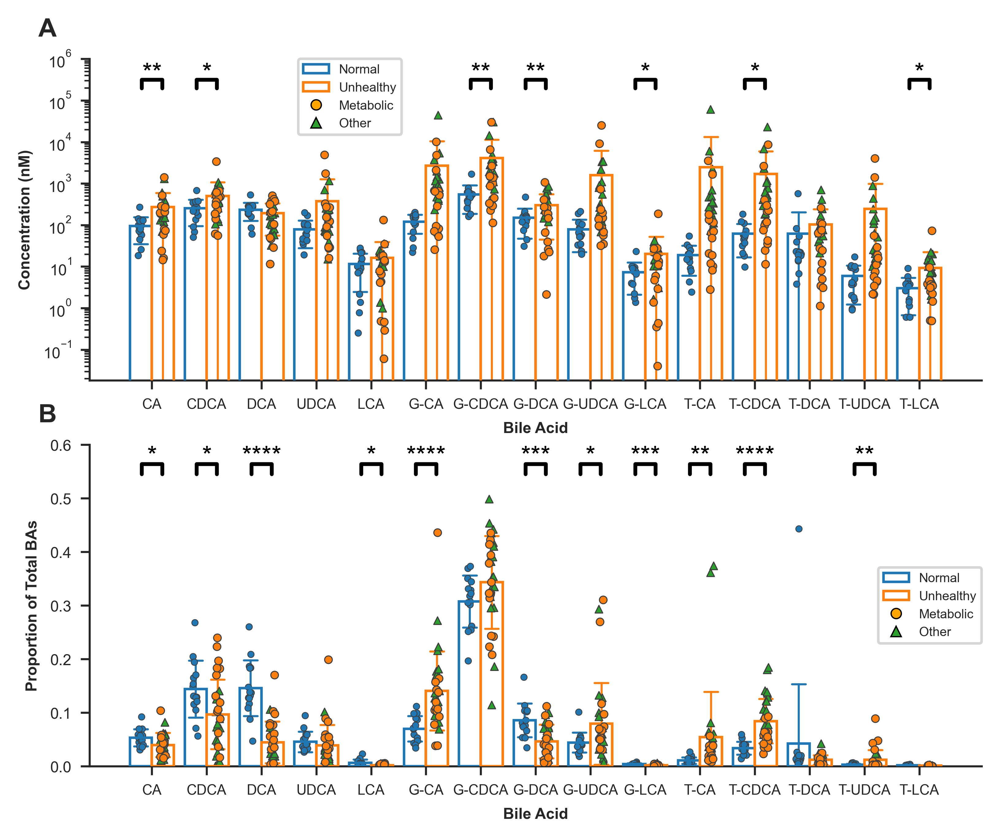

In [83]:
fig, axs = plt.subplot_mosaic([['A'], ['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
sns.set_style("ticks")


sns.barplot(data=abs_DF, x="BA", y="Concentration", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)

sns.stripplot(data=normal_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=2.5, legend=False, linewidth=.3)
sns.stripplot(data=metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10)
sns.stripplot(data=other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, palette=['C0', 'C2'], marker='^')


ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')

ax1.set_yscale('log')




sns.barplot(data=prop_DF, x="BA", y="Proportion", ax=ax2, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)

sns.stripplot(data=normal_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=2.5, legend=False, linewidth=.3)
sns.stripplot(data=metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10)
sns.stripplot(data=other_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, palette=['C0', 'C2'],  marker='^')

ax2.set_ylabel("Proportion of Total BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')


#Annotations
#Ax1
ax1_annotations = automatic_annotations_conc(abs_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None,1e6)

#Ax2
ax2_annotations = automatic_annotations_prop(prop_DF, type="individual")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(0,0.6)

for label, ax in axs.items():
    #ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


from matplotlib.lines import Line2D
from matplotlib.patches import Patch

legend_elements = [Patch(facecolor='white', edgecolor='C0',
                         label='Normal'),
                         Patch(facecolor='white', edgecolor='C1',
                         label='Unhealthy'),
                         Line2D([0], [0], marker='o', color='w', label='Metabolic',
                          markerfacecolor='orange', markersize=4, markeredgecolor='black', markeredgewidth=0.5, alpha=1),
                        Line2D([0], [0], marker='^', color='w', label='Other',
                        markerfacecolor='C2', markersize=4, markeredgecolor='black', markeredgewidth=0.5, alpha=1)
                          ]

# Create the figure

ax1.legend(handles=legend_elements, borderaxespad=0., fontsize=5, bbox_to_anchor=(0.35,1))
ax2.legend(handles=legend_elements, loc='center right', borderaxespad=0., fontsize=5)

#plt.savefig("Joseph_fig11.eps", bbox_inches='tight')

plt.show()

S8 Fig

In [84]:
metabolic_other_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"].isin(["Metabolic", "Other"])]
metabolic_other_abs_DF

,BA,Concentration,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,119.0,Unhealthy,Other
1,CA,334.0,Unhealthy,Other
2,CA,398.0,Unhealthy,Other
3,CA,492.0,Unhealthy,Other
5,CA,69.5,Unhealthy,Other
...,...,...,...,...
697,T-LCA,0.0,Unhealthy,Metabolic
698,T-LCA,0.49,Unhealthy,Metabolic
699,T-LCA,0.0,Unhealthy,Metabolic
702,T-LCA,3.4,Unhealthy,Metabolic


In [85]:
metabolic_other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"].isin(["Metabolic", "Other"])]
metabolic_other_prop_DF

,BA,Proportion,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,0.000734,Unhealthy,Other
1,CA,0.036579,Unhealthy,Other
2,CA,0.054558,Unhealthy,Other
3,CA,0.061677,Unhealthy,Other
5,CA,0.006268,Unhealthy,Other
...,...,...,...,...
697,T-LCA,0.0,Unhealthy,Metabolic
698,T-LCA,0.001498,Unhealthy,Metabolic
699,T-LCA,0.0,Unhealthy,Metabolic
702,T-LCA,0.001839,Unhealthy,Metabolic


In [86]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Other"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Metabolic", ba), ("Other", ba), p_value))

    return annotations

In [87]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Other"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Metabolic", ba), ("Other", ba), p_value))

    return annotations

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\64156022.py:9: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(data=metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C1"])
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\64156022.py:10: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(data=other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C2"], marker="^")
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\64156022.py:21: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, whic

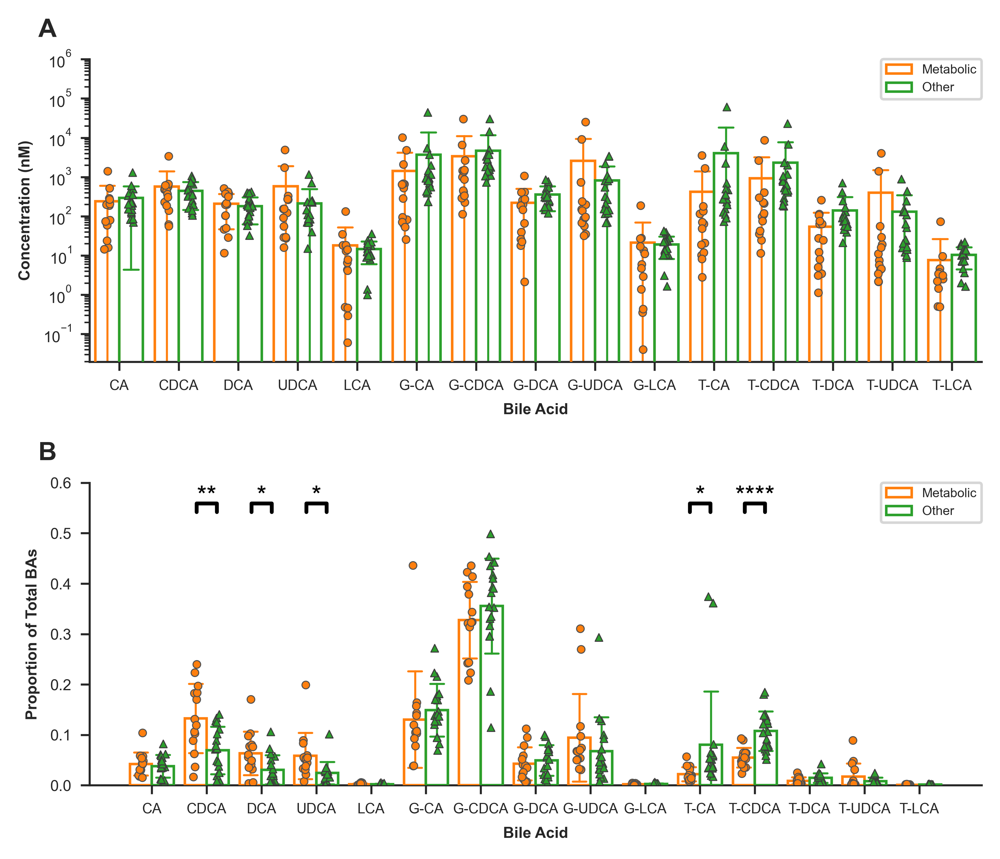

In [89]:
fig, axs = plt.subplot_mosaic([['A'], ['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
sns.set_style("ticks")

sns.barplot(data=metabolic_other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, palette=["C1", "C2"])

sns.stripplot(data=metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C1"])
sns.stripplot(data=other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C2"], marker="^")



ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')

ax1.set_yscale('log')

sns.barplot(data=metabolic_other_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, palette=["C1", "C2"])

sns.stripplot(data=metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C1"])
sns.stripplot(data=other_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C2"], marker="^")


ax2.set_ylabel("Proportion of Total BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')

for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


#Annotations
#Ax1
ax1_annotations = automatic_annotations_conc(metabolic_other_abs_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None,1e6)

#Ax2
ax2_annotations = automatic_annotations_prop(metabolic_other_prop_DF, type="individual")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(0,0.6)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

#plt.savefig("S8-Fig.eps", bbox_inches='tight')

plt.show()

S9 Fig

In [90]:
normal_metabolic_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"].isin(["Normal", "Metabolic"])]
normal_metabolic_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"].isin(["Normal", "Metabolic"])]

In [91]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Normal"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Metabolic", ba), p_value))

    return annotations

In [92]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Normal"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Metabolic", ba), p_value))

    return annotations

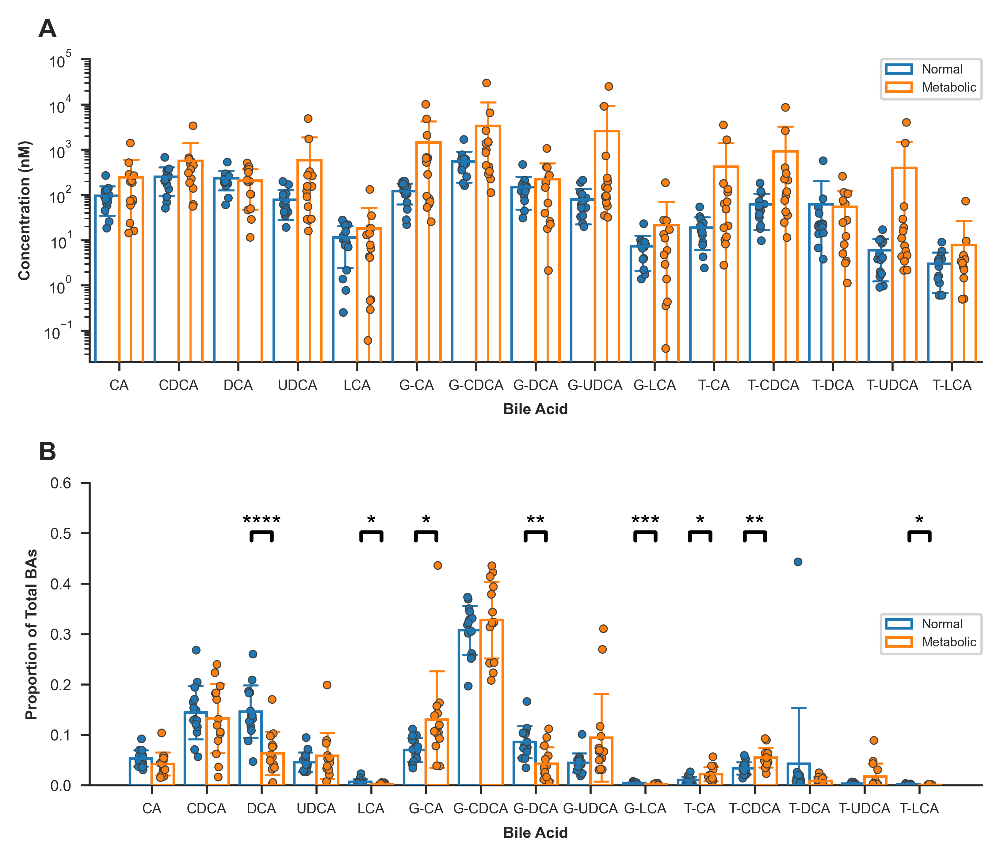

In [95]:
fig, axs = plt.subplot_mosaic([['A'], ['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

sns.barplot(data=normal_metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=normal_metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4)

ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')

ax1.set_yscale('log')


sns.barplot(data=normal_metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=normal_metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4)

ax2.set_ylabel("Proportion of Total BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')

#Annotations
#Ax1
ax1_annotations = automatic_annotations_conc(normal_metabolic_abs_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None,1e5)

#Ax2
ax2_annotations = automatic_annotations_prop(normal_metabolic_prop_DF, type="individual")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(0,0.6)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

ax1.legend(loc='upper right', borderaxespad=0., fontsize=5)
ax2.legend(loc='center right', borderaxespad=0., fontsize=5)

#plt.savefig("S9-Fig.eps", bbox_inches='tight')

plt.show()



S4 Fig

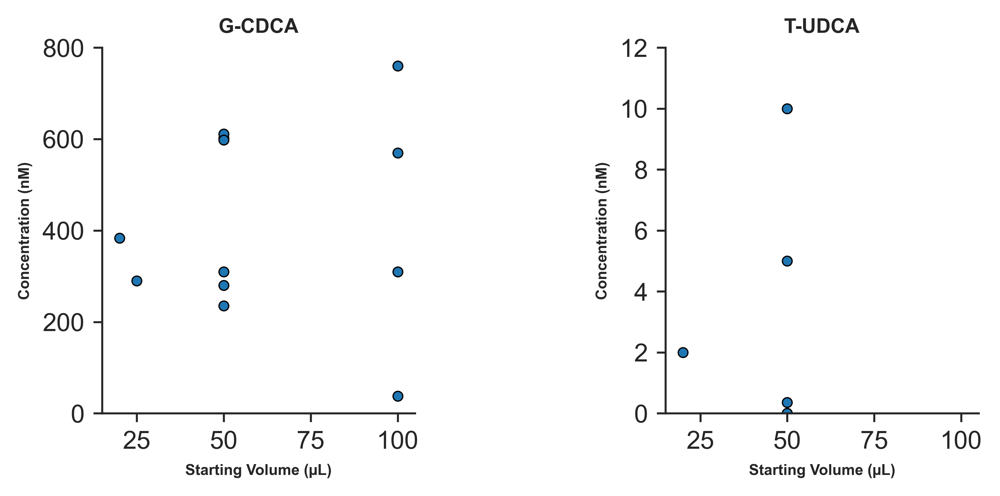

In [96]:
fig, axs = plt.subplot_mosaic([['A', 'B']],figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']


#Fig C
sns.scatterplot(data=gcdca_plasma_fasted_lcms_normal_DF, x="Starting Volume", y="Conc", ax=ax1, s=15, edgecolor='black', linewidth=0.5)
ax1.set_ylim(0, 800)
ax1.set_xlim(15,105)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Starting Volume (µL)", fontsize=6, weight='bold')
ax1.set_title("G-CDCA", fontsize=8, weight='bold')

#Fig D
sns.scatterplot(data=tudca_plasma_fasted_lcms_normal_DF, x="Starting Volume", y="Conc", ax=ax2, s=15, edgecolor='black', linewidth=0.5)
ax2.set_ylim(0, 12)
ax2.set_xlim(15,105)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Starting Volume (µL)", fontsize=6, weight='bold')
ax2.set_title("T-UDCA", fontsize=8, weight='bold')

for label, ax in axs.items():
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.8, top=0.92, hspace=0.5)

#plt.savefig("S4-Fig.eps", bbox_inches='tight')

plt.show()

S5 Fig

In [97]:
plasma_fifty_hundred_fasted_lcms_nm_data = plasma_fasted_lcms_nm_data.loc[plasma_fasted_lcms_nm_data["Starting Volume"].isin([50, 100])]

In [98]:
protein_precipitation_counts = plasma_fifty_hundred_fasted_lcms_nm_data['Protein Precipitation'].value_counts()
protein_precipitation_counts = protein_precipitation_counts.sort_index(ascending=False)

In [99]:
gbas_plasma_fifty_fasted_lcms_normal_DF = DF.loc[(DF["Healthy/Unhealthy"]=="Normal") & (DF["Analysis Technique"]=="LC-MS") & (DF["Fasted/Fed"]=="Fasted") & (DF["Serum/Plasma"]=="Plasma") & (DF["BA"].isin(["G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA"])) & (DF["Starting Volume"].isin([50, 100]))]
tbas_plasma_fifty_fasted_lcms_normal_DF = DF.loc[(DF["Healthy/Unhealthy"]=="Normal") & (DF["Analysis Technique"]=="LC-MS") & (DF["Fasted/Fed"]=="Fasted") & (DF["Serum/Plasma"]=="Plasma") & (DF["BA"].isin(["T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"])) & (DF["Starting Volume"].isin([50, 100]))]

In [100]:
gcdca_plasma_fifty_hundred_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="G-CDCA") & (healthy_DF["Starting Volume"].isin([50,100]))]
tudca_plasma_fifty_hundred_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="T-UDCA") & (healthy_DF["Starting Volume"].isin([50,100]))]

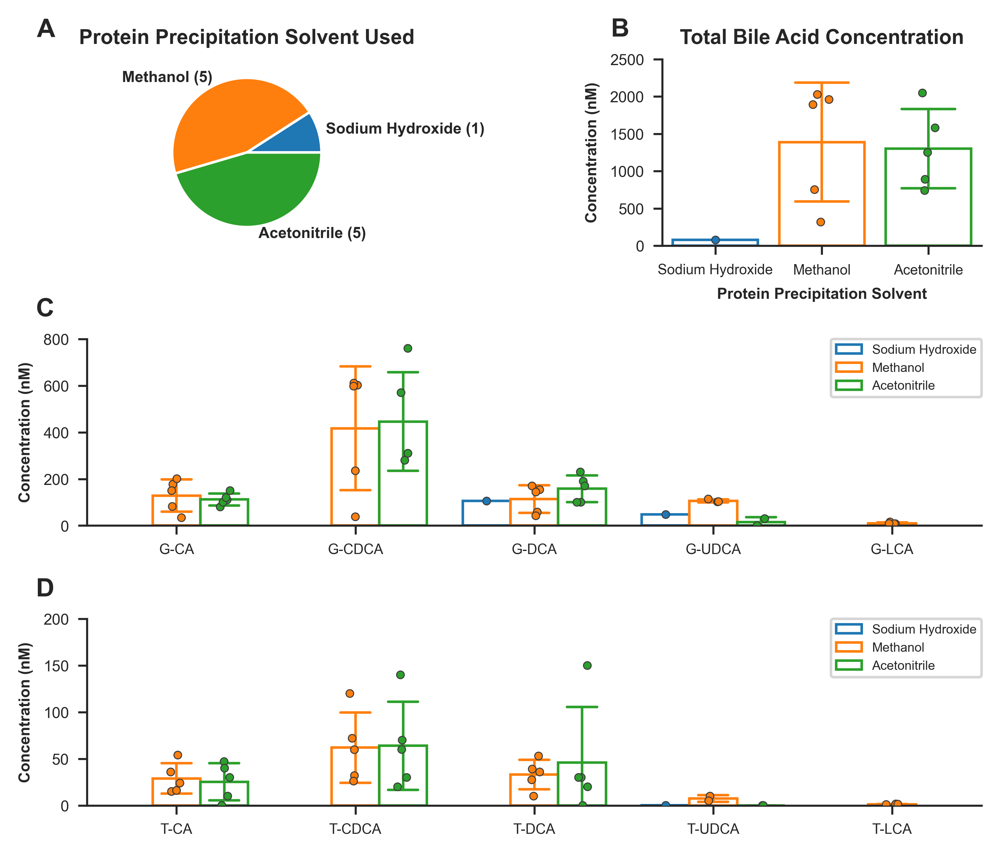

In [101]:
fig, axs = plt.subplot_mosaic([['A', 'B'], ['C', 'C'] , ['D', 'D']],figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']
ax4 = axs['D']



#Fig A
ax1.pie(protein_precipitation_counts, labels=[f"{value} ({count})" for value, count in protein_precipitation_counts.items()],  textprops={'fontsize': 6, 'fontweight': 'bold'})


ax1.set_title("Protein Precipitation Solvent Used", fontsize=8, weight='bold')

#Fig B
sns.barplot(data=plasma_fifty_hundred_fasted_lcms_nm_data, x="Protein Precipitation", y="Total BAs", ax=ax2, hue="Protein Precipitation", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order=["Sodium Hydroxide", "Methanol", "Acetonitrile"], hue_order=["Sodium Hydroxide", "Methanol", "Acetonitrile"])
sns.stripplot(data=plasma_fifty_hundred_fasted_lcms_nm_data, x='Protein Precipitation', y='Total BAs', hue='Protein Precipitation', ax=ax2, dodge=False, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order=["Sodium Hydroxide", "Methanol", "Acetonitrile"])

ax2.set_ylim(0, 2500)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acid Concentration", fontsize=8, weight='bold')


#Fig C
sns.barplot(data=gbas_plasma_fifty_fasted_lcms_normal_DF, x='BA', y="Conc", ax=ax3, hue="Protein Precipitation", fill=False, errorbar="sd", capsize=0.5, err_kws= {'linewidth': 1}, linewidth=1, hue_order=["Sodium Hydroxide", "Methanol", "Acetonitrile"], legend=True)
sns.stripplot(data=gbas_plasma_fifty_fasted_lcms_normal_DF, x='BA', y='Conc', ax=ax3,  hue='Protein Precipitation', dodge=True, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order=["Sodium Hydroxide", "Methanol", "Acetonitrile"])

ax3.set_ylim(0, 800)
ax3.legend(loc='upper right', borderaxespad=0., fontsize=5)
ax3.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax3.set_xlabel("")

#Fig D
sns.barplot(data=tbas_plasma_fifty_fasted_lcms_normal_DF, x='BA', y="Conc", ax=ax4, hue="Protein Precipitation", fill=False, errorbar="sd", capsize=0.5, err_kws= {'linewidth': 1}, linewidth=1, hue_order=["Sodium Hydroxide", "Methanol", "Acetonitrile"], legend=True)
sns.stripplot(data=tbas_plasma_fifty_fasted_lcms_normal_DF, x='BA', y='Conc', ax=ax4,  hue='Protein Precipitation', dodge=True, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order=["Sodium Hydroxide", "Methanol", "Acetonitrile"])

ax4.set_ylim(0, 200)
ax4.legend(loc='upper right', borderaxespad=0., fontsize=5)
ax4.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax4.set_xlabel("")

for label, ax in axs.items():

    if ax == ax1:
        ax.text(
            -0.35, 1.0, label, transform=(
                ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
            fontsize='10', va='bottom', weight='bold')
    else: 
        ax.text(
            0.0, 1, label, transform=(
                ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
            fontsize='10', va='bottom', weight='bold')
        ax.xaxis.set_tick_params(labelsize=5.5)
        ax.yaxis.set_tick_params(labelsize=6)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.8, top=0.92, hspace=0.5)

#plt.savefig("S5-Fig.eps", bbox_inches='tight')

plt.show()

S6 Fig

In [102]:
healthy_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Exact Analysis Technique,Starting Volume,Average Age,Number of Patients,Protein Precipitation,NAFLD/NASH/Cirrhosis,Liver/Non-Liver
1,1,CA,142.00,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy
2,2,CA,184.00,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy
4,4,CA,107.00,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy
7,7,CA,115.00,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy
9,9,CA,199.00,Fasted,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,3217,T-LCA,0.33,Unknown,Serum,LC-MS,Normal,LC-MS/MS,50.0,NaN,NaN,Methanol,Normal,Healthy
3220,3220,T-LCA,NaN,Fasted,Plasma,LC-MS,Normal,UPLC-MS,100.0,39.2,24.0,Methanol,Normal,Healthy
3221,3221,T-LCA,NaN,Fasted,Serum,LC-MS,Normal,UPLC-MS/MS,100.0,NaN,90.0,Acetonitrile,Normal,Healthy
3222,3222,T-LCA,20.00,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,25.0,46.0,12.0,Trichloroacetic Acid,Normal,Healthy


In [103]:
healthy_DF["All/Filtered"] = "All"
healthy_total_DF["All/Filtered"] = "All"
healthy_DF["All"] = "All"
healthy_total_DF["All"] = "All"

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\246599000.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthy_DF["All/Filtered"] = "All"
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\246599000.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthy_total_DF["All/Filtered"] = "All"
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_24364\246599000.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = val

In [104]:
healthy_total_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Liver/Non-liver,NAFLD/NASH/Cirrhosis,Protein Precipitation,Starting Volume,All/Filtered,All
1,1,totalCA,443.1,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
2,2,totalCA,479.3,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
4,4,totalCA,408.4,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
7,7,totalCA,349.8,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
9,9,totalCA,293.8,Fasted,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,1067,totalLCA,NaN,Unknown,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
1070,1070,totalLCA,NaN,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,100.0,All,All
1071,1071,totalLCA,7.5,Fasted,Serum,LC-MS,Normal,Healthy,Normal,Acetonitrile,100.0,All,All
1072,1072,totalLCA,70.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Trichloroacetic Acid,25.0,All,All


In [105]:
healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["Starting Volume"] == 50) & (healthy_DF["Protein Precipitation"] == "Methanol"), "All/Filtered"] = "Filtered" 

In [106]:
healthy_total_DF.loc[(healthy_total_DF["Analysis Technique"]=="LC-MS") & (healthy_total_DF["Fasted/Fed"]=="Fasted") & (healthy_total_DF["Serum/Plasma"]=="Plasma") & (healthy_total_DF["Starting Volume"] == 50) & (healthy_total_DF["Protein Precipitation"] == "Methanol"), "All/Filtered"] = "Filtered" 

In [107]:
filtered_healthy_DF = healthy_DF[healthy_DF["All/Filtered"] == "Filtered"]
filtered_healthy_total_DF = healthy_total_DF[healthy_total_DF["All/Filtered"] == "Filtered"]

In [108]:
filtered_healthy_total_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Liver/Non-liver,NAFLD/NASH/Cirrhosis,Protein Precipitation,Starting Volume,All/Filtered,All
40,40,totalCA,134.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
111,111,totalCA,442.9,Fasted,Plasma,LC-MS,Normal,Non-Liver,NaN,Methanol,50.0,Filtered,All
132,132,totalCA,396.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
133,133,totalCA,288.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
255,255,totalCDCA,364.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
326,326,totalCDCA,915.8,Fasted,Plasma,LC-MS,Normal,Non-Liver,NaN,Methanol,50.0,Filtered,All
347,347,totalCDCA,976.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
348,348,totalCDCA,1004.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
470,470,totalDCA,245.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,50.0,Filtered,All
541,541,totalDCA,532.5,Fasted,Plasma,LC-MS,Normal,Non-Liver,NaN,Methanol,50.0,Filtered,All


In [109]:
filtered_healthy_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Exact Analysis Technique,Starting Volume,Average Age,Number of Patients,Protein Precipitation,NAFLD/NASH/Cirrhosis,Liver/Non-Liver,All/Filtered,All
40,40,CA,37.0,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,50.0,40.5,26.0,Methanol,Normal,Healthy,Filtered,All
111,111,CA,230.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,29.0,7.0,Methanol,NaN,Non-Liver,Filtered,All
132,132,CA,141.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,38.5,85.0,Methanol,Normal,Healthy,Filtered,All
133,133,CA,114.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,47.1,59.0,Methanol,Normal,Healthy,Filtered,All
255,255,CDCA,97.0,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,50.0,40.5,26.0,Methanol,Normal,Healthy,Filtered,All
326,326,CDCA,254.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,29.0,7.0,Methanol,NaN,Non-Liver,Filtered,All
347,347,CDCA,245.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,38.5,85.0,Methanol,Normal,Healthy,Filtered,All
348,348,CDCA,334.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,47.1,59.0,Methanol,Normal,Healthy,Filtered,All
470,470,DCA,177.0,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,50.0,40.5,26.0,Methanol,Normal,Healthy,Filtered,All
541,541,DCA,335.0,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,29.0,7.0,Methanol,NaN,Non-Liver,Filtered,All


In [110]:
healthy_total_DF

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Liver/Non-liver,NAFLD/NASH/Cirrhosis,Protein Precipitation,Starting Volume,All/Filtered,All
1,1,totalCA,443.1,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
2,2,totalCA,479.3,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
4,4,totalCA,408.4,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
7,7,totalCA,349.8,Fed,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
9,9,totalCA,293.8,Fasted,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,1067,totalLCA,NaN,Unknown,Serum,LC-MS,Normal,Healthy,Normal,Methanol,50.0,All,All
1070,1070,totalLCA,NaN,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Methanol,100.0,All,All
1071,1071,totalLCA,7.5,Fasted,Serum,LC-MS,Normal,Healthy,Normal,Acetonitrile,100.0,All,All
1072,1072,totalLCA,70.0,Fasted,Plasma,LC-MS,Normal,Healthy,Normal,Trichloroacetic Acid,25.0,All,All


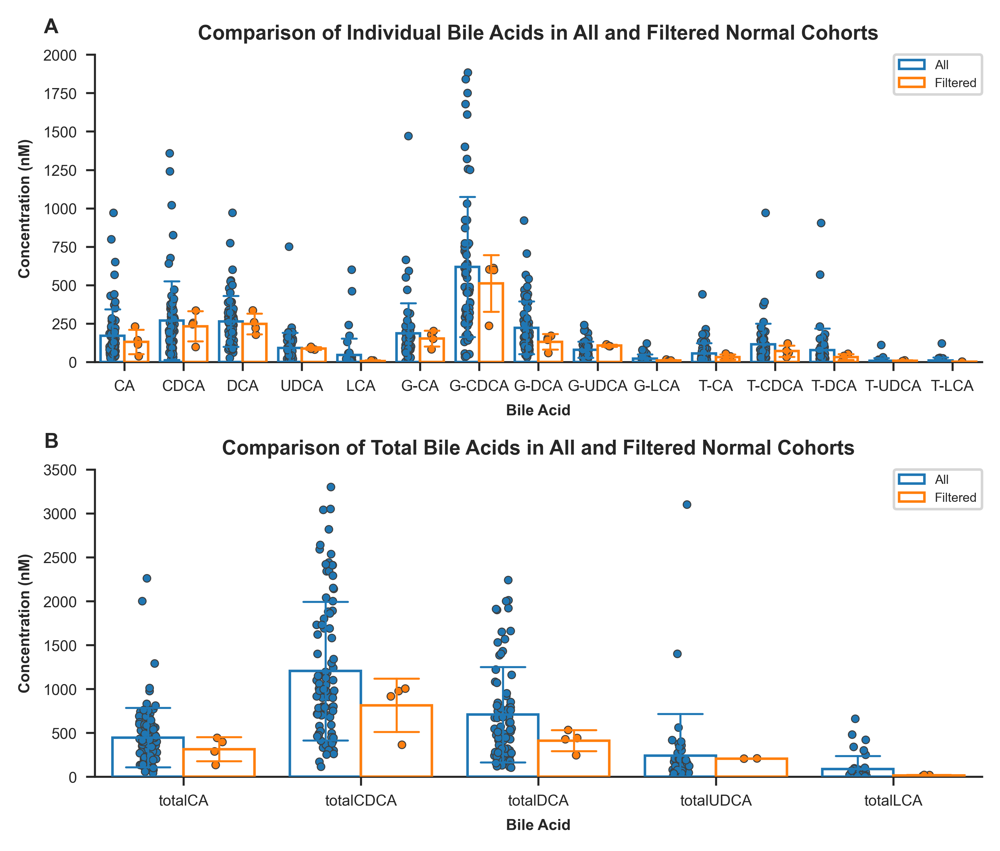

In [111]:
fig, axs = plt.subplot_mosaic([['A', 'A', 'A'], ['B', 'B','B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

#Fig A
sns.barplot(x="BA", y="Conc", data=healthy_DF, hue="All", ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True)
sns.barplot(x="BA", y="Conc", data=filtered_healthy_DF, hue="All/Filtered", ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True, legend=False)
sns.stripplot(x='BA', y='Conc', data=healthy_DF, hue="All", dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])
sns.stripplot(x='BA', y='Conc', data=filtered_healthy_DF, hue="All/Filtered", dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])

ax1.set_ylim(0, 2000)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Comparison of Individual Bile Acids in All and Filtered Normal Cohorts", fontsize=8, weight='bold')


#Fig B
sns.barplot(x="BA", y="Conc", data=healthy_total_DF, hue="All", ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True)
sns.barplot(x="BA", y="Conc", data=filtered_healthy_total_DF, hue="All/Filtered", ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True, legend=False)
sns.stripplot(x='BA', y='Conc', data=healthy_total_DF, hue="All", dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])
sns.stripplot(x='BA', y='Conc', data=filtered_healthy_total_DF, hue="All/Filtered", dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])

ax2.set_ylim(0, 3500)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Comparison of Total Bile Acids in All and Filtered Normal Cohorts", fontsize=8, weight='bold')


#fig.suptitle("Peripheral Blood: Normal Populations", fontsize=8, weight='bold')

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.35)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=6)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)


#plt.savefig("S6-Fig.eps", bbox_inches='tight')

plt.show()


S7 Table

In [112]:
#Statistical test for altered variance - Levene (Brown-Forsythe)

bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

p_values = {}
for ba in bas_list:
    all_values = healthy_DF[healthy_DF["BA"] == ba]["Conc"].dropna().to_list()
    filtered_values = filtered_healthy_DF[filtered_healthy_DF["BA"] == ba]["Conc"].dropna().to_list()
    
    stat, p_value = stats.levene(all_values, filtered_values, center='median')

    p_values.update({ba: [p_value, np.var(all_values), np.var(filtered_values)]})

In [113]:
p_values

{'CA': [0.5009126143390016, 29244.11888423122, 4756.25],
 'CDCA': [0.38253230871382693, 64480.48905749414, 7320.25],
 'DCA': [0.2756793300226381, 27024.56520317307, 3373.25],
 'UDCA': [0.359320321458657, 9957.223269198472, 57.046666666666624],
 'LCA': [0.5726896322367148, 11335.43862500455, 20.222222222222225],
 'G-CA': [0.48707918042793663, 38129.343503460346, 1982.25],
 'G-CDCA': [0.1553969304960413, 204384.88456317812, 25506.25],
 'G-DCA': [0.21078166207114093, 28914.995403308214, 1886.75],
 'G-UDCA': [0.04925209211945024, 2759.7761163273954, 29.555555555555554],
 'G-LCA': [0.30087986430417113, 727.5756748209689, 10.067499999999999],
 'T-CA': [0.37312816257467485, 4462.638815512747, 213.00187499999998],
 'T-CDCA': [0.4327472790211636, 17575.98813834932, 1012.1075000000001],
 'T-DCA': [0.5241082464609707, 19828.011344134673, 248.421875],
 'T-UDCA': [0.7385020279251799, 272.68513198194916, 6.25],
 'T-LCA': [0.508114777347466, 432.76854757539644, 0.062222222222222234]}

In [114]:
#Statistical test for altered variance - Levene (Brown-Forsythe)

bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]

p_values = {}
for ba in bas_list:
    all_values = healthy_total_DF[healthy_total_DF["BA"] == ba]["Conc"].dropna().to_list()
    filtered_values = filtered_healthy_total_DF[filtered_healthy_total_DF["BA"] == ba]["Conc"].dropna().to_list()
    
    stat, p_value = stats.levene(all_values, filtered_values, center='median')

    p_values.update({ba: [p_value, np.var(all_values), np.var(filtered_values)]})


In [115]:
p_values

{'totalCA': [0.4100188682689385, 114163.47929565971, 14102.301875],
 'totalCDCA': [0.11089791511644506, 614451.6832262839, 68800.9075],
 'totalDCA': [0.10313871612398025, 291106.86503584805, 10868.421875],
 'totalUDCA': [0.6057868216321227, 219043.87712004606, 2.25],
 'totalLCA': [0.37475119348113595, 21464.069568999996, 25.039999999999996]}

S1 Fig

In [116]:
healthy_peripheral_data = peripheral_data[peripheral_data["Healthy/Unhealthy"].isin(["Normal"])]

In [117]:
gcdca_healthy_DF = healthy_DF[healthy_DF["BA"].isin(["G-CDCA"])]
tudca_healthy_DF = healthy_DF[healthy_DF["BA"].isin(["T-UDCA"])]

In [118]:
def hue_regplot(data, x, y, hue, palette=None, **kwargs):
    from matplotlib import colormaps
    
    regplots = []
    
    levels = sorted(data[hue].unique()) #sorted added to get alphabetical order i.e. ['Healthy', 'Unhealthy']
    
    if palette is None:
        #default_colors = get_cmap('tab10') 
        default_colors = colormaps['tab10']
        palette = {k: default_colors(i) for i, k in enumerate(levels)}
    
    for key in levels:
        regplots.append(
            sns.regplot(
                x=x,
                y=y,
                data=data[data[hue] == key],
                color=palette[key],
                **kwargs
            )
        )
    
    return regplots

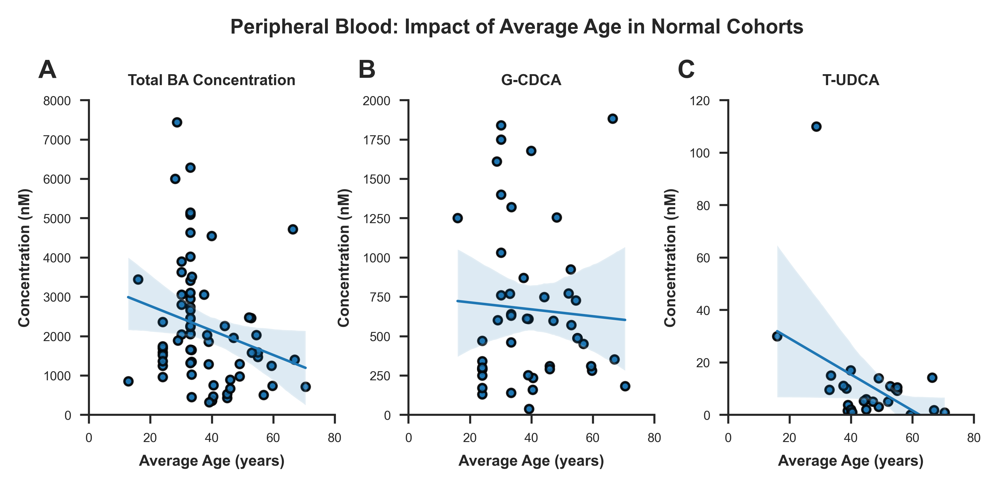

In [126]:
fig, axs = plt.subplot_mosaic([['A', 'B', 'C']], figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']

#Fig A
sns.scatterplot(data=healthy_peripheral_data, x="Average Age", y="Total BAs", ax=ax1, s=10, edgecolor='black', linewidth=0.5, legend=False)
# for hue_value in lcms_healthy_unhealthy_peripheral_data['Healthy/Unhealthy'].unique():
#     filtered_df = lcms_healthy_unhealthy_peripheral_data[lcms_healthy_unhealthy_peripheral_data['Healthy/Unhealthy'] == hue_value]
#     sns.regplot(x="Starting Volume", y="Total BAs", data=filtered_df, ax=ax2, ci=95)
hue_regplot(data=healthy_peripheral_data, x="Average Age", y="Total BAs", ax=ax1, scatter_kws={'s': 10, 'edgecolor': 'black'}, hue='Healthy/Unhealthy', line_kws={'linewidth': 1})
ax1.set_ylim(0, 8000)
ax1.set_xlim(0, 80)
ax1.set_title("Total BA Concentration", fontsize=6, weight='bold')

#Fig B
sns.scatterplot(data=gcdca_healthy_DF, x="Average Age", y="Conc", ax=ax2, s=10, edgecolor='black', linewidth=0.5, legend=False)
# for hue_value in gcdca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'].unique():
#     filtered_df = gcdca_lcms_healthy_unhealthy_DF[gcdca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'] == hue_value]
#     sns.regplot(x="Starting Volume", y="Conc", data=filtered_df, ax=ax3, ci=95)
hue_regplot(data=gcdca_healthy_DF, x="Average Age", y="Conc", hue='Healthy/Unhealthy', ax=ax2, scatter_kws={'s': 10, 'edgecolor': 'black'}, line_kws={'linewidth': 1})


ax2.set_ylim(0, 2000)
ax2.set_xlim(0, 80)
ax2.set_title("G-CDCA", fontsize=6, weight='bold')


#Fig C
sns.scatterplot(data=tudca_healthy_DF, x="Average Age", y="Conc", ax=ax3, s=10, edgecolor='black', linewidth=0.5)
# for hue_value in tlca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'].unique():
#     filtered_df = tlca_lcms_healthy_unhealthy_DF[tlca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'] == hue_value]
#     sns.regplot(x="Starting Volume", y="Conc", data=filtered_df, ax=ax4, ci=95)
hue_regplot(data=tudca_healthy_DF, x="Average Age", y="Conc", hue='Healthy/Unhealthy', ax=ax3, scatter_kws={'s': 10, 'edgecolor': 'black'}, line_kws={'linewidth': 1})

ax3.set_ylim(0, 120)
ax3.set_xlim(0, 80)
ax3.set_title("T-UDCA", fontsize=6, weight='bold')

axes = [ax1, ax2, ax3]

for i in axes:
    i.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
    i.set_xlabel("Average Age (years)", fontsize=6, weight='bold')
    #i.set_title("", fontsize=10, weight='bold')
    i.xaxis.set_tick_params(labelsize=5)
    i.yaxis.set_tick_params(labelsize=5)
    i.spines['top'].set_visible(False)
    i.spines['right'].set_visible(False)

fig.suptitle("Peripheral Blood: Impact of Average Age in Normal Cohorts", fontsize=8, weight='bold')

plt.subplots_adjust(wspace=0.3, top=0.8, hspace=2)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    

#plt.savefig("S1-Fig.eps", bbox_inches='tight')

plt.show()
